In [1]:
from astropy.io import fits
import os
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from mpl_toolkits.mplot3d import Axes3D
np.seterr(divide='ignore', invalid='ignore');
plt.rcParams.update({'figure.max_open_warning': 0})
import scipy.stats as stats
import astropy.units as u
from astropy.table import Table, Column, MaskedColumn, join
from tqdm import tqdm
from bisect import bisect_left
c = 2.998e10
k = 1.38e-16
h = 6.626e-27
plt.rcParams.update({'font.size': 22})
halpha = 6564.61
hbeta = 4862.68
hgamma = 4341.68
hdelta = 4102.89
plt.rcParams['figure.figsize'] = [10, 7]
from IPython.display import Audio, display
def allDone():
    display(Audio(filename='beep.mp3', autoplay=True))
from scipy.interpolate import interp1d,InterpolatedUnivariateSpline
import lmfit

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx
import emcee
import corner
import numdifftools
from scipy.ndimage import interpolation
from scipy.signal import medfilt
from scipy.interpolate import interp1d
from multiprocessing import Pool
import pickle
import h5py
import multiprocessing
import itertools
from multiprocessing import sharedctypes
import scipy
from PyAstronomy.pyasl import dopplerShift
from astroquery.sdss import SDSS
from astropy.coordinates import SkyCoord
import glob
import astropy.io.votable as votable
from PyAstronomy.pyasl import crosscorrRV, quadExtreme
%matplotlib inline
import pwlf

/Users/vedantchandra/anaconda3/lib/python3.7/site-packages/astroquery/sdss/__init__.py:29: UserWarning: Experimental: SDSS has not yet been refactored to have its API match the rest of astroquery (but it's nearly there).
  warnings.warn("Experimental: SDSS has not yet been refactored to have its API "
/Users/vedantchandra/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/Users/vedantchandra/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/Users/vedantchandra/anaconda3/lib/python3.7/site-packages/tensorflow/

In [2]:
table = Table.read('filetable.fits')

In [3]:
table

white_dwarf_name_1,designation,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,pmra,pmra_error,pmdec,pmdec_error,astrometric_excess_noise,astrometric_sigma5d_max,phot_g_mean_flux,phot_g_mean_flux_error,phot_g_mean_mag,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_mag,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,l,b,density,AG,SDSS_name_1,umag_1,e_umag_1,gmag_1,e_gmag_1,rmag_1,e_rmag_1,imag_1,e_imag_1,zmag_1,e_zmag_1,test_Pwd,Pwd_flag,Teff,eTeff,log_g,elog_g,mass,emass,chi2,Teff_He,eTeff_He,log_g_He,elog_g_He,mass_He,emass_He,chisq_He,white_dwarf_name_2,SDSS_name_2,SDSS_ra,SDSS_dec,umag_2,e_umag_2,gmag_2,e_gmag_2,rmag_2,e_rmag_2,imag_2,e_imag_2,zmag_2,e_zmag_2,Plate,mjd,fiberID,S/N,spectral_class,specpath
bytes23,bytes28,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bytes19,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bytes23,bytes19,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,float64,bytes10,bytes70
WDJ025854.43+003040.34,Gaia DR2 74698071455360,74698071455360,44.72646901556998,0.28567386112959603,0.5112707464812695,0.25599366159026676,14.500739904268581,0.36579731793162606,-78.52656079709863,0.5427489490094788,15.012084874836075,0.5470492489368379,0.0,0.5372557,534.3824372487403,1.8082009054878507,18.868734,312.15862412335844,18.40885445099136,19.11545,362.21514538571427,11.172177243298819,18.364504,1.2619685,176.11511398045826,-48.74189973283115,2772.1445,0.17931461323760367,J025854.44+003040.3,19.962,0.033,19.174,0.01,18.833,0.01,18.694,0.013,18.661,0.04,0.988624,0,5912.964868,303.260477,8.372084,0.167457,0.827522,0.111186,1.319487,5759.198239,311.522807,8.282587,0.185514,0.752814,0.123687,1.221527,WDJ025854.43+003040.34,J025854.44+003040.3,44.726785,0.51121322,19.962,0.033,19.174,0.01,18.833,0.01,18.694,0.013,18.661,0.04,3184,54850,476,22.13875775,DA,../scratch/spec/spectra_batch_006/74698071455360_spec_2.fits
WDJ030342.24+005310.43,Gaia DR2 152935195517952,152935195517952,45.92584768471102,0.18368731112639675,0.8861145695998326,0.2010294471025037,4.671757153169625,0.3331957274737135,-30.908062217688194,0.3572135974662655,-26.73967510017829,0.34644328777017175,0.27127564966991097,0.43184733,1177.987020866133,2.9259743881980267,18.010515,878.0295268386217,9.245145660546411,17.992615,489.7343926137647,7.6349728756875725,18.037018,1.1611027,176.96708518810607,-47.62112094935022,2448.3142,0.1866174361585069,J030342.22+005310.3,18.287,0.015,17.879,0.006,18.117,0.007,18.35,0.011,18.611,0.039,0.999324,0,13259.833096,649.629009,7.786484,0.154615,0.493008,0.069604,0.007033,12730.785698,538.47192,7.745324,0.14715,0.473115,0.049265,10.165591,WDJ030342.24+005310.43,J030342.22+005310.3,45.925915,0.88615422,18.287,0.015,17.879,0.006,18.117,0.007,18.35,0.011,18.611,0.039,7255,56597,541,37.07371632,DA,../scratch/spec/spectra_batch_002/152935195517952_spec_2.fits
WDJ030451.07+010644.99,Gaia DR2 185954904271872,185954904271872,46.212790997041324,0.5160441824748764,1.1124797793563967,0.5408620242643588,0.9023387726781019,0.6681183968825999,1.2395325533553607,1.0945712074894716,-3.8588736577358373,1.0264476122799477,0.0,1.0174972,202.12171815590497,1.6276458955658366,19.924334,126.50702819483377,10.634988238286617,20.096102,107.24490792917832,10.180014395408431,19.685978,1.1564909,177.01995172650172,-47.25742609153092,3312.5933,0.17410005440944148,J030451.06+010644.9,21.071,0.083,19.971,0.017,19.927,0.02,20.03,0.032,19.942,0.113,0.304529,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,WDJ030451.07+010644.99,J030451.06+010644.9,46.212773,1.1125,21.071,0.083,19.971,0.017,19.927,0.02,2

## Classification Cuts - White Dwarfs, Main Sequence, Uncertain Region

#### Define Spectrum Processing Functions

In [4]:
spec_files = glob.glob('ks_spec/*')
lamgrid = np.arange(4000,8000)

def planck(wl,c1,c2):
    return 1e21*c1 / (wl**5 * (np.exp(1e4*c2/wl) - 1 ))

def planck(wl, c1, c2):
    return c1*wl + c2

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

def get_raw_spectrum(source_id):
    path = table[table['source_id'] == source_id][0]['specpath']
    try:
        with fits.open(path) as f:
            flux = f[1].data['flux']
            loglam = f[1].data['loglam']
            fluxsig = f[1].data['ivar']
            lam = 10**loglam
            f.close()
    except:
        raise OSError('Spectrum file missing...')
    
    return lam,flux#,fluxsig


def continuum_normalize(flux,lam,sigarray = None):
    spec = flux
    pixels = lam-4000
    continuum = (pixels > 2900) + (pixels < 2200)*(pixels > 1050) + (pixels < 650)*(pixels > 530) \
             + (pixels < 220)*(pixels > 200) + (pixels < 35)*(pixels > 20) + (pixels < -200)*(pixels > -450)
    
    notnan = (~np.isnan(spec))+(~np.isnan(lam))
    skylinemask = (lam > 5578.5 - 10)*(lam < 5578.5 + 10) + (lam > 5894.6 - 10)*(lam < 5894.6 + 10)\
        + (lam > 6301.7 - 10)*(lam < 6301.7 + 10) + (lam > 7246.0 - 10)*(lam < 7246.0 + 10)
        
    pwfunc = pwlf.PiecewiseLinFit(lam[continuum*notnan],spec[continuum*notnan])
    breakpoints = np.asarray([-350,-200,20,35,200,220,400,530,650,850,1050,\
                        1400,1800,2200,2500,2900,3200,3400,3600,3800]) + 4000
    breaks = pwfunc.fit_with_breaks(breakpoints)
    cont = pwfunc.predict(lam)
    contcorr = spec / cont
    contcorr[skylinemask] = 1
    where = np.isnan(contcorr)+(contcorr > 1.25) + (contcorr < 0)
    contcorr[where] = 1
    if sigarray is not None:
        stdev = np.sqrt(1.0/sigarray)
        contsigarray = stdev / cont
        normivar = (1.0/contsigarray)**2
        return contcorr,normivar
    
#     plt.figure(figsize = (15,5))
#     plt.plot(lam[continuum*notnan],spec[continuum*notnan])
#     plt.plot(lam,cont)
#     plt.figure(figsize = (15,5))
#     plt.plot(contcorr)
#     plt.plot(continuum)
#     plt.figure(figsize = (15,5))
    return contcorr

def rv_corr(normflux,lam):
    alphaline = find_nearest(lam,halpha)
    betaline = find_nearest(lam,hbeta)
    gammaline = find_nearest(lam,hgamma)
    deltaline = find_nearest(lam,hdelta)
    cores = (lam == alphaline) + (lam == betaline) + (lam == gammaline) + (lam == deltaline)
    cores = cores.astype(int)
    xcorrs = crosscorrRV(lam,1-normflux,lam,cores, -100, 100, 5, 'doppler', skipedge = 25)
    corrs = xcorrs[1]
    rvs = xcorrs[0]
    try:
        specrv = quadExtreme(rvs,corrs, 'max', (10,10), fullOutput = True)[0]
    except:
        specrv = 0
    shift_flux,shift_lam = dopplerShift(lam,normflux,specrv, edgeHandling = 'fillValue', fillValue = 1)
    return shift_flux,shift_lam

def interpolate_flux(normflux,lam):
    func = interp1d(lam,normflux,kind='linear',assume_sorted = True, fill_value = 'extrapolate')
    interpflux = func(lamgrid)
    return interpflux

def get_spectrum(source_id):
    path = table[table['source_id'] == source_id][0]['specpath']
    try:
        with fits.open(path) as f:
            flux = f[1].data['flux']
            loglam = f[1].data['loglam']
            fluxsig = f[1].data['ivar']
            lam = 10**loglam
            f.close()
    except:
        raise FileNotFoundError('Spectrum file missing...')
        return
    ## RV Correction and Interpolation
    
    #normalized_spectrum = continuum_normalize(flux,lam)
    #rv_corrected_flux,rv_corrected_lam = rv_corr(normalized_spectrum,lam)
    interpolated_flux = interpolate_flux(flux, lam)
    
    return interpolated_flux

In [5]:
lamgrid,get_spectrum(table['source_id'][7543])[1]

(array([4000, 4001, 4002, ..., 7997, 7998, 7999]), 14.246233815792948)

## Build Dataset

##### For this demonstration, we are training a binary classifier to identify DA white dwarf spectra that are 1) identified as DA by Kepler AND 2) belong in the high-confidence white dwarf section of our color magnitude diagram. During the training step, the model is fed both high-confidence sdA's and high-confidence DA's - where Kepler's labels agree with our visual expectation from the CMD. Later on, we will apply this classifier to stars in the uncertain strip between the main sequence and white dwarf tracks. 

In [6]:
filetable = table

DA = filetable['spectral_class'] == 'DA'
filetable = filetable[DA]
len(filetable)

15491

In [7]:
spectra = [];
for jj in tqdm(range(len(filetable))):
    obj = filetable[jj]
    try:
        spec = get_spectrum(obj['source_id'])
        spectra.append(spec)
    except:
        spectra.append(np.repeat(np.nan,4000))

100%|██████████| 15491/15491 [06:34<00:00, 39.22it/s]


In [8]:
spectra = np.asarray(spectra)
len(spectra)
cleanspec = ~np.max(np.isnan(spectra),1)
cleantable = filetable[cleanspec]
cleanspectra = spectra[cleanspec]

In [9]:
def make_binary(spectrum1, spectrum2, relrv, parallax1, parallax2):
    spectrum2 = dopplerShift(lamgrid,spectrum2,relrv, edgeHandling = 'firstlast')
    func = interp1d(spectrum2[1],spectrum2[0], fill_value = 'extrapolate', kind = 'linear')
    spectrum2 = func(lamgrid)
    binary = spectrum1 + spectrum2 * (parallax1/parallax2)**2
    return binary

Text(0.5, 1.0, 'Normalized Binary')

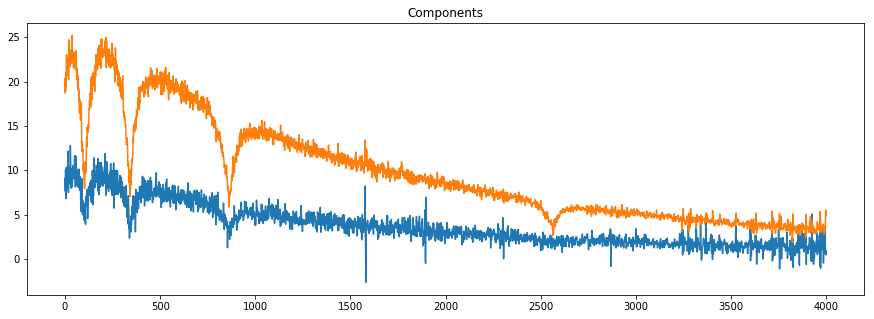

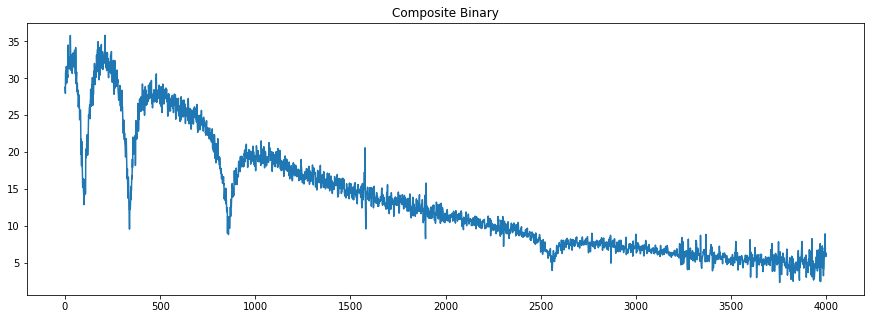

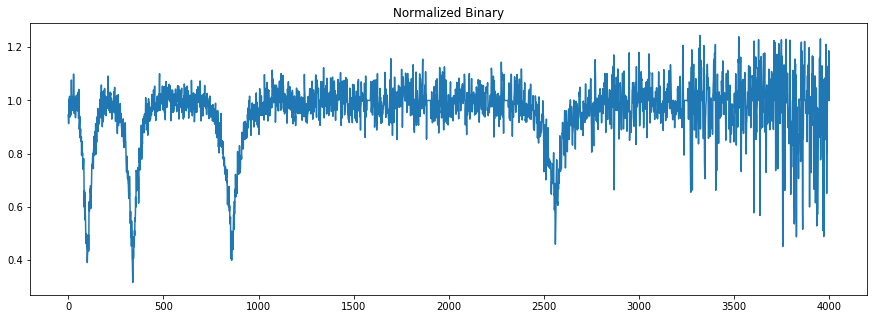

In [10]:
ii = np.random.randint(len(cleantable))
jj = np.random.randint(len(cleantable))
rv = 150*np.random.randn()
frac = 0.5
par1 = cleantable['parallax'][ii]
par2 = cleantable['parallax'][jj]

plt.figure(figsize = (15,5))
plt.title('Components')
plt.plot(cleanspectra[ii])
plt.plot(cleanspectra[jj] * (par1/par2)**2) 

plt.figure(figsize = (15,5))
plt.plot(make_binary(cleanspectra[ii],cleanspectra[jj],rv,par1,par2))
plt.title('Composite Binary')

plt.figure(figsize = (15,5))
plt.plot(continuum_normalize(make_binary(cleanspectra[ii],cleanspectra[jj],rv,par1,par2),lamgrid))
plt.title('Normalized Binary')

In [11]:
def generate_random_binary():
    ii = np.random.randint(0, len(cleanspectra))
    jj = np.random.randint(0, len(cleanspectra))
    rv = 250*np.random.randn() ### Parameterize this with actual RV distribution
    par1 = cleantable['parallax'][ii]
    par2 = cleantable['parallax'][jj]
    spec1 = cleanspectra[ii]
    spec2 = cleanspectra[jj]
    return continuum_normalize(make_binary(spec1, spec2, rv, par1, par2),lamgrid)
def generate_random_single():
    ii = np.random.randint(0, len(cleanspectra))
    return continuum_normalize(cleanspectra[ii],lamgrid)

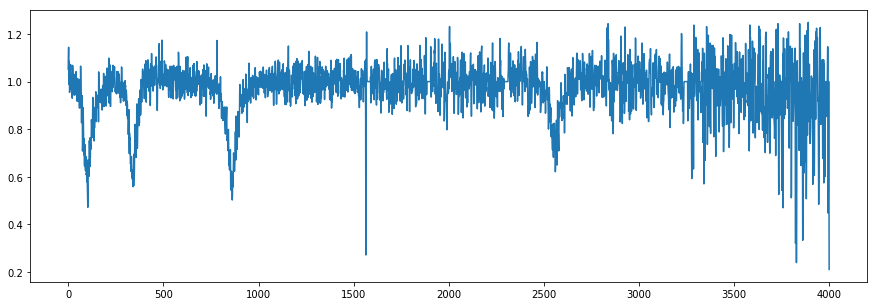

In [12]:
plt.figure(figsize = (15,5))
plt.plot(generate_random_binary())

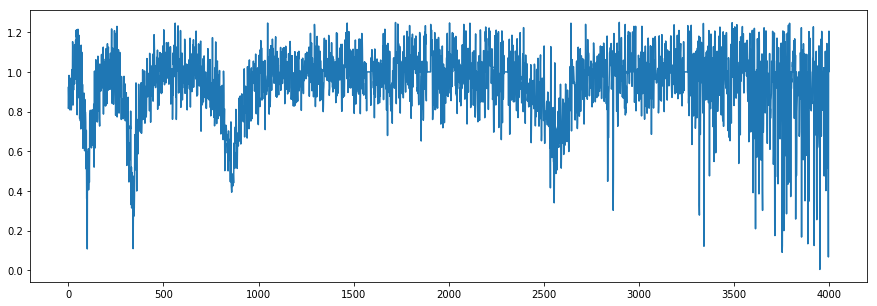

In [13]:
plt.figure(figsize = (15,5))
plt.plot(generate_random_single())

In [14]:
def samplegen(coinflip):
    if coinflip == 0:
        return generate_random_single()
    elif coinflip == 1:
        return generate_random_binary()

In [15]:
def batchgen(batchsize):
    coinflips = np.random.binomial(1, 0.5, batchsize)
    samples = np.asarray([samplegen(coinflip) for coinflip in coinflips])
    return samples, coinflips

## Artificial Neural Network

In [36]:
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.regularizers import l2
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize,scale,MinMaxScaler,StandardScaler,OneHotEncoder
# import astroNN.nn.layers as annlayers
# import astroNN.nn.losses as annlosses
from sklearn.metrics import roc_curve, roc_auc_score, auc
encoder = OneHotEncoder(categories = 'auto')
#from keras import backend as K
#K.set_image_dim_ordering('tf')
from tensorflow.keras.metrics import AUC
import astroNN

In [34]:
def auroc(y_true, y_pred):
    return tf.py_function(roc_auc_score, (y_true, y_pred), tf.double)

In [60]:
reg = 1e-8
dropRate = 0.3
acti = 'relu'

def nn():
    x = Input(batch_shape = (None,4000,1))
    
    y = Conv1D(4, (8), activation = acti, padding = 'same', kernel_regularizer = l2(reg), name = 'Filter1',\
              input_shape = (None,4000,1)) (x)
    
    #y = astroNN.nn.layers.MCDropout(dropRate) (y)
    
    y = Conv1D(8, (8), activation = acti, padding = 'same', kernel_regularizer = l2(reg),name = 'Filter2') (y)
    
    y = MaxPooling1D(4) (y)
    
    y = Flatten() (y)
    
    #y = astroNN.nn.layers.MCDropout(dropRate) (y)
    
    y = Dense(64, activation = acti, kernel_regularizer = l2(reg)) (y)
    
    #y = astroNN.nn.layers.MCDropout(dropRate) (y)
    
    y = Dense(32, activation = acti, kernel_regularizer = l2(reg)) (y)
    
    out = Dense(2, activation='softmax', name = 'out') (y)
    
    model = Model(inputs = x, outputs = out)
    
    model.compile(optimizer = Adamax(), loss = 'binary_crossentropy', \
                  metrics = [auroc])
    return model

history = np.asarray([]);
vhistory = np.asarray([]);
model = nn()
model.load_weights('corbett_cnn.h5')
print(model.summary())

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 4000, 1)           0         
_________________________________________________________________
Filter1 (Conv1D)             (None, 4000, 4)           36        
_________________________________________________________________
Filter2 (Conv1D)             (None, 4000, 8)           264       
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 1000, 8)           0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 8000)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 64)                512064    
_________________________________________________________________
dense_4 (Dense)              (None, 32)                2080

In [ ]:
for i in tqdm(range(100)): 
    print('training batch %i'%(i+1))
    batchsize = 64*100
    X_train,y_train = batchgen(batchsize)
    X_train = X_train.reshape((len(X_train),4000,1))
    y_train = encoder.fit_transform(y_train.reshape(-1,1)).toarray()
    X_test,y_test = batchgen(100)
    X_test = X_test.reshape((len(X_test),4000,1))
    y_test = encoder.transform(y_test.reshape(-1,1)).toarray()
    n_epochs = 25
    minibatchsize = 64

    print('stochastic sample generated... training on sample...')
    h = model.fit(X_train,y_train, epochs = n_epochs, verbose = 1, \
                  batch_size = minibatchsize, validation_data = [X_test,y_test])
    history = np.append(history, h.history['loss'])
    vhistory = np.append(vhistory, h.history['val_loss'])
    model.save_weights('corbett_cnn.h5')

<IPython.core.display.Javascript object>


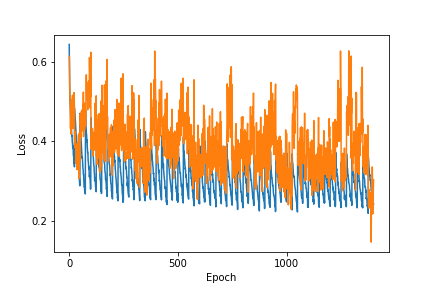

<IPython.core.display.Javascript object>


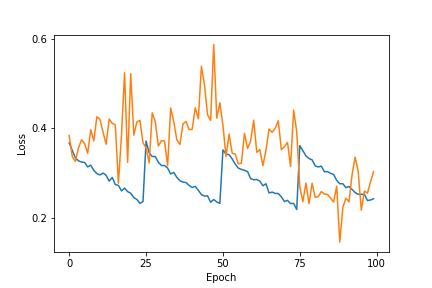

Text(0, 0.5, 'Loss')

In [353]:
plt.figure()
plt.plot(history);
plt.plot(vhistory)
plt.xlabel('Epoch')
plt.ylabel('Loss')
r = 100
plt.figure()
plt.plot(history[-r:]);
plt.plot(vhistory[-r:]);
plt.xlabel('Epoch')
plt.ylabel('Loss')

In [62]:
X_test,y_test = batchgen(1000)
y_test = encoder.fit_transform(y_test.reshape(-1,1)).toarray()
X_test = X_test.reshape((len(X_test),4000,1))

pred_proba = model.predict(X_test)
preds = pred_proba[:,1] > pred_proba[:,0]

fpr,tpr,_ = roc_curve(y_test[:,1],pred_proba[:,1])

W1111 15:18:10.231758 4622665152 deprecation_wrapper.py:119] From /Users/vedantchandra/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:422: The name tf.global_variables is deprecated. Please use tf.compat.v1.global_variables instead.



Text(0, 0.5, 'True Positive Rate')

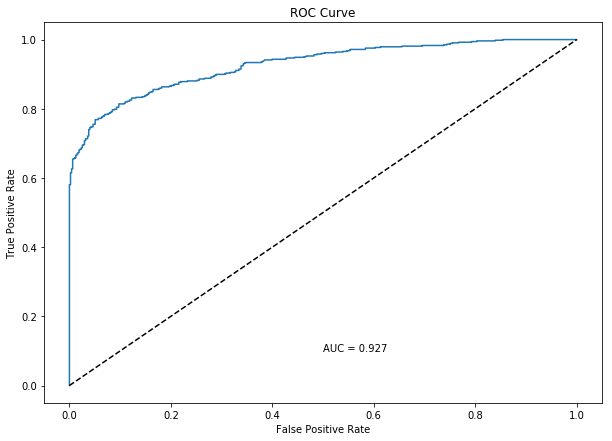

In [63]:
plt.figure(figsize = (10,7))
plt.plot(fpr,tpr)
x = np.linspace(0,1,100)
plt.plot(x,x,'k--')
plt.title('ROC Curve')
plt.text(0.5,0.1,'AUC = %.3f'%auc(fpr,tpr))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

# print("Thresholded Accuracy on validation dataset: %.2f percent"%(sum(preds == y_test[:,1])/len(y_test)*100));
# pred = model.predict(X_test)
# choice_class = pred[:,1] > pred(X_test)[:,0]
# print("MLE Classification Accuracy on validation dataset: %.2f percent"\
#       %(sum(choice_class == y_test[:,1])/len(y_test)*100));

# Apply to Actual Dataset

In [64]:
normcleanspectra = [continuum_normalize(spec,lamgrid) for spec in cleanspectra]

In [65]:
normcleanspectra = np.asarray(normcleanspectra)

In [88]:
bin_prob = model.predict(normcleanspectra.reshape((len(normcleanspectra),4000,1)))

Text(0, 0.5, 'Frequency')

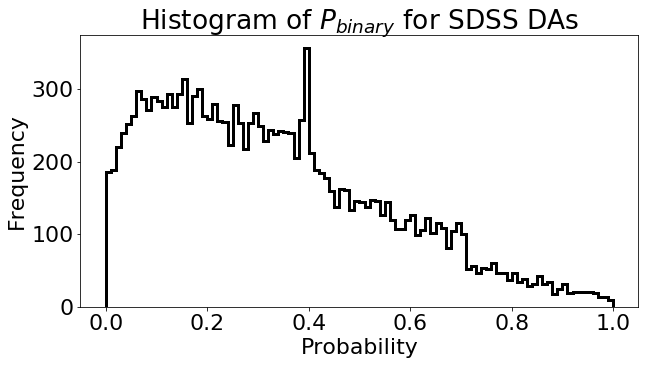

In [89]:
plt.rcParams.update({'font.size': 22})
plt.figure(figsize = (10,5))
plt.hist(bin_prob[:,1], histtype = 'step', linewidth = 3, color = 'k', bins=100)
plt.title('Histogram of $P_{binary}$ for SDSS DAs');
plt.xlabel('Probability')
plt.ylabel('Frequency')

In [90]:
threshold = 0.99

In [91]:
binaries = bin_prob[:,1] > threshold

In [92]:
cleantable['bin_prob'] = bin_prob[:,1]

In [93]:
cleantable['g_abs'] = cleantable['phot_g_mean_mag'] + 5 + 5*np.log10(cleantable['parallax']/1000)
cleantable['bp-rp'] = cleantable['phot_bp_mean_mag'] - cleantable['phot_rp_mean_mag']

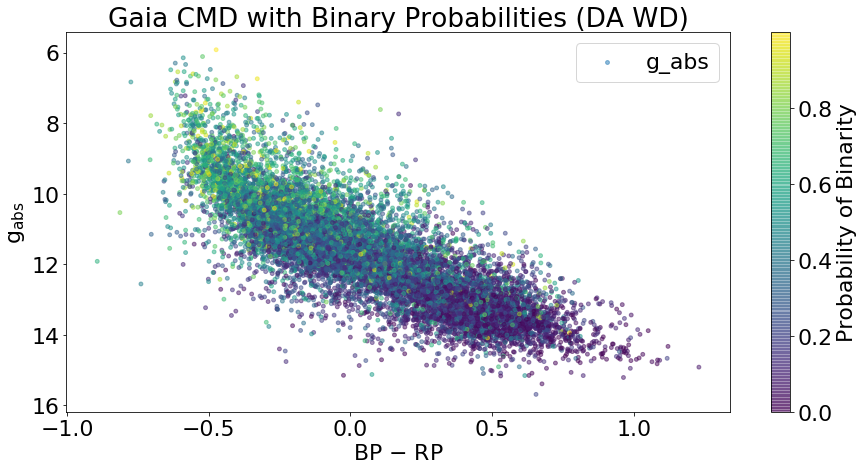

In [94]:
plt.figure(figsize = (13,7))
plt.rcParams.update({'font.size': 22})

plt.scatter(cleantable['bp-rp'], cleantable['g_abs'], s = 15, alpha = 0.5, c = cleantable['bin_prob'],\
           cmap = 'viridis')
cbar = plt.colorbar()
cbar.ax.set_ylabel('Probability of Binarity')

plt.legend()
plt.title('Gaia CMD with Binary Probabilities (DA WD)')
plt.xlabel('BP $-$ RP')
plt.ylabel('g$_{\mathrm{abs}}$')
plt.gca().invert_yaxis()
plt.tight_layout()

In [95]:
sum(binaries)

9

660311742420794368
Probability of Binarity = 0.99
132.1905910785487 19.017032738968894


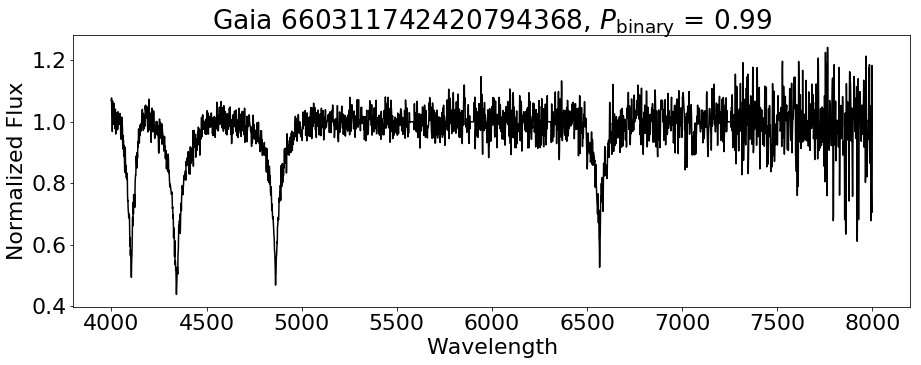

709600306073392000
Probability of Binarity = 0.99
128.6954583973821 30.83300583402085


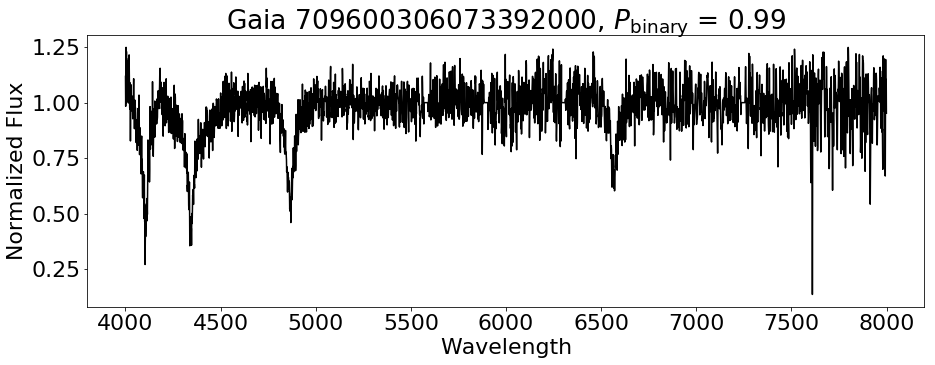

1029988751638125824
Probability of Binarity = 1.00
131.63518059650107 54.04760542566349


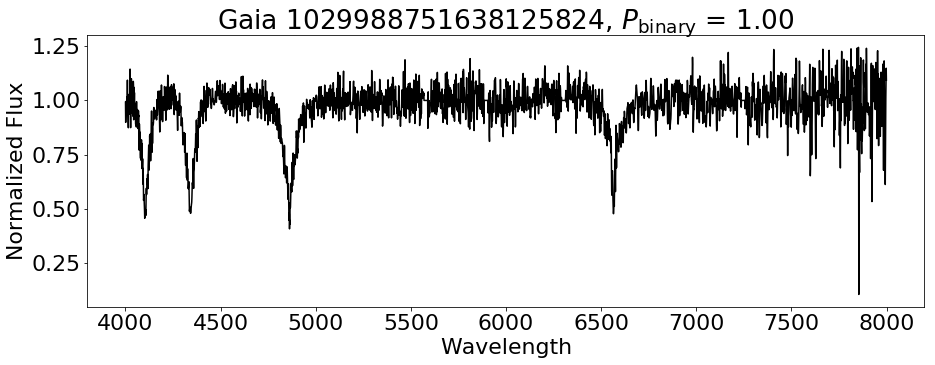

1509190729733934080
Probability of Binarity = 0.99
209.60293569717996 47.49212183924198


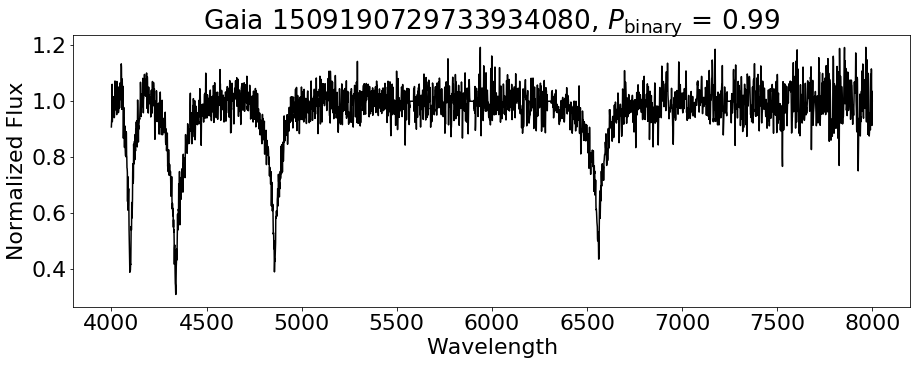

3999256289409661440
Probability of Binarity = 1.00
180.18104645993702 20.16694407844336


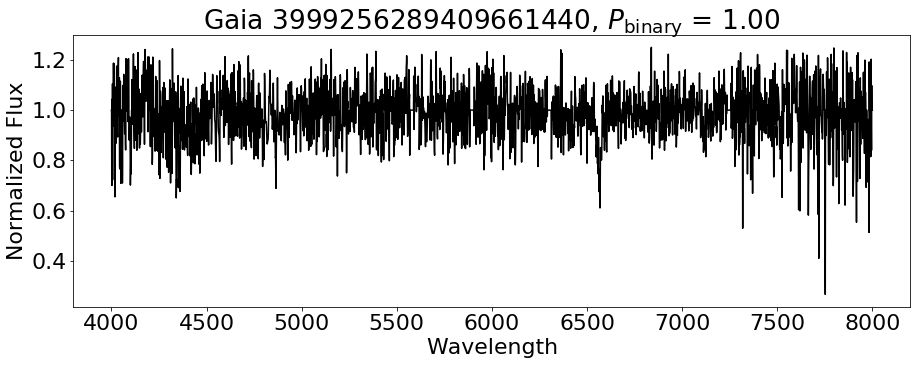

4021132791231581056
Probability of Binarity = 0.99
176.00874287975924 31.157257535555974


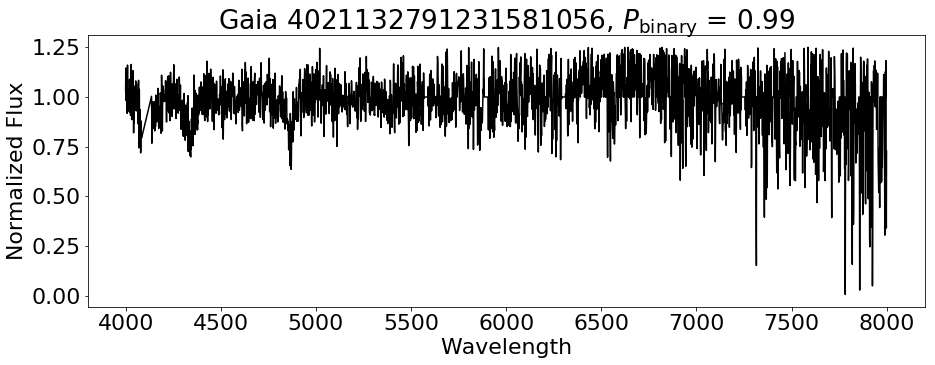

4420398311187340160
Probability of Binarity = 0.99
230.82819831939696 0.8299491279663458


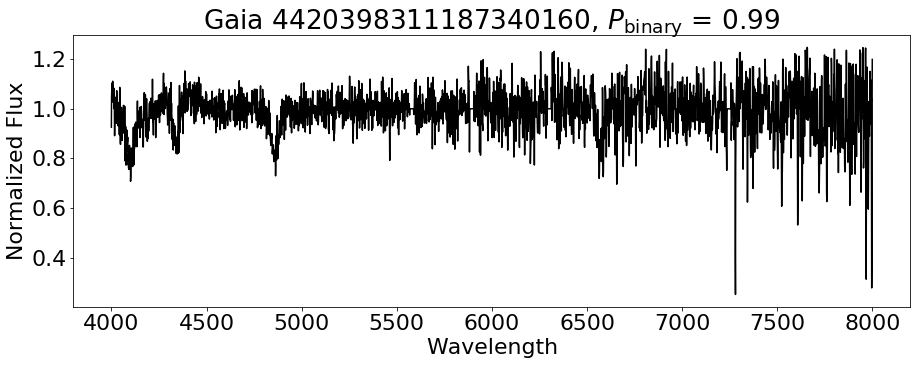

4421205249642736128
Probability of Binarity = 0.99
230.99891578568995 2.3115487199271505


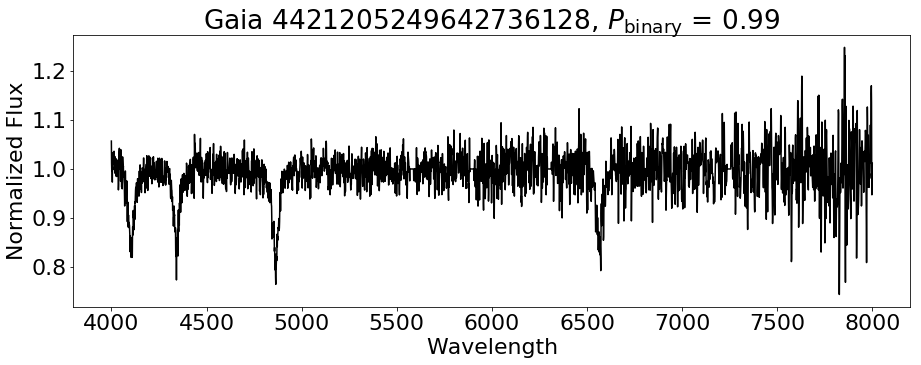

6907270760248588416
Probability of Binarity = 1.00
310.99399392447754 -6.840569374930298


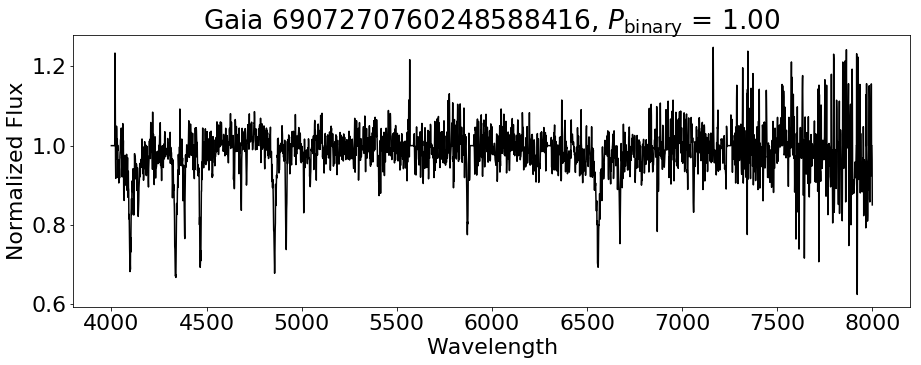

In [96]:
cont = [];
for obj in cleantable[binaries]:
    if get_spectrum(obj['source_id'])[0] == np.nan:
        continue
        cont.append(0)
    plt.figure(figsize = (15,5))
    plt.plot(lamgrid,continuum_normalize(get_spectrum(obj['source_id']),lamgrid),'k')
    plt.title('Gaia '+str(obj['source_id'])+', $P_{\mathrm{binary}}$ = %.2f'%obj['bin_prob'])
    print(obj['source_id'])
    print('Probability of Binarity = %.2f'%obj['bin_prob'])
    plt.xlabel('Wavelength')
    plt.ylabel('Normalized Flux')
    plt.savefig('binary_'+str(obj['source_id'])+'png')
    print(str(obj['ra']) + ' '+str(obj['dec']))
    cont.append(1)
    plt.show()

## Fit Single Spectra

In [383]:
from scipy.optimize import minimize, dual_annealing

In [384]:
def generator():
    x = Input(shape=(2,))
    y = Dense(32,activation='sigmoid',trainable = True)(x)
    y = Dense(32,activation='sigmoid',trainable = True)(y)
    out = Dense(4000,activation='linear',trainable = True)(y)
    
    model = Model(inputs = x, outputs = out)
    model.compile(optimizer = Adamax(lr = 0.002), loss = 'mse', \
                  metrics = ['mae'])
    return model
dagen = generator()
dagen.load_weights('DAGEN.h5')

In [385]:
def fitspec(datspec):
    specvar = np.var(datspec[2000:2100])
    def chispec(params):
        p1,p2,p3 = params
        label = np.asarray([[p1,p2]]).reshape(1,-1)
        genspec = np.ravel(dagen.predict(label))
        genspec = dopplerShift(lamgrid,genspec,p3*100, edgeHandling = 'fillValue', fillValue = 1)
        genspec = interpolate_flux(genspec[0],genspec[1])
        resid = datspec - genspec
        return np.sum(resid**2)/specvar
    m = minimize(chispec, [0.5,0.5, 0], method = 'Powell', tol = 1e-10)
    #m = dual_annealing(chispec, bounds = [(0,1),(0,1),(-2,2)], maxiter = 2500, x0 = [0.5,0.5,1])
    p = m.x
    fittedspec = dagen.predict(p[0:2].reshape(1,-1))[0,:]
    fittedspec = dopplerShift(lamgrid,fittedspec,p[2]*100, edgeHandling = 'fillValue', fillValue = 1)
    fittedspec = interpolate_flux(fittedspec[0],fittedspec[1])
    return fittedspec, m.fun/len(fittedspec)

In [386]:
len(cleantable[binaries])

36

<IPython.core.display.Javascript object>


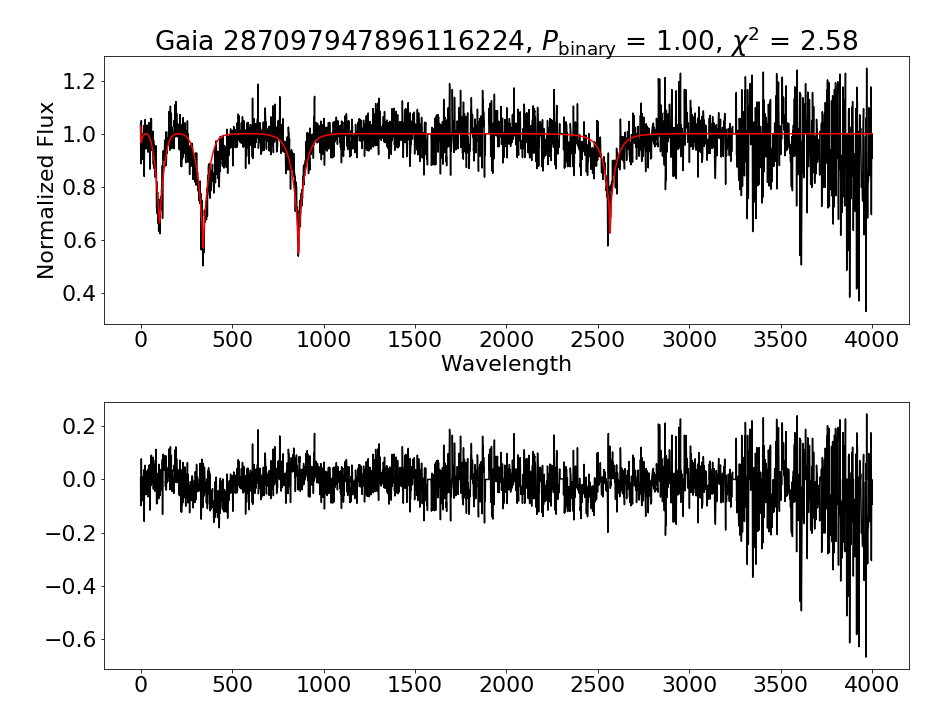

287097947896116224
Probability of Binarity = 1.00
89.68673970142827 64.68949553024959


<IPython.core.display.Javascript object>


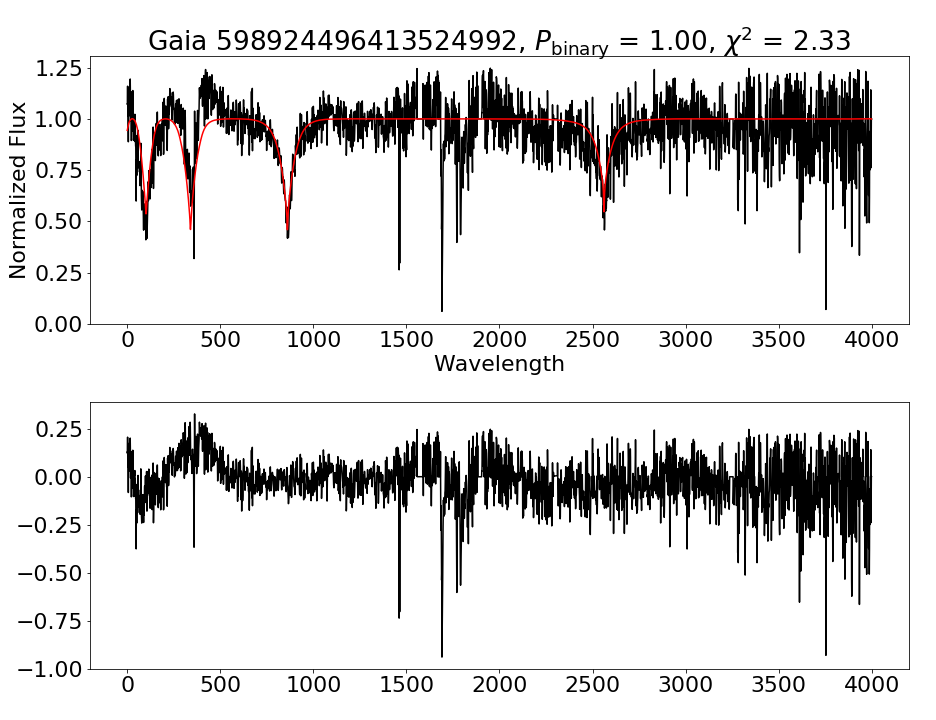

598924496413524992
Probability of Binarity = 1.00
132.08580247933676 11.484687179071125


<IPython.core.display.Javascript object>


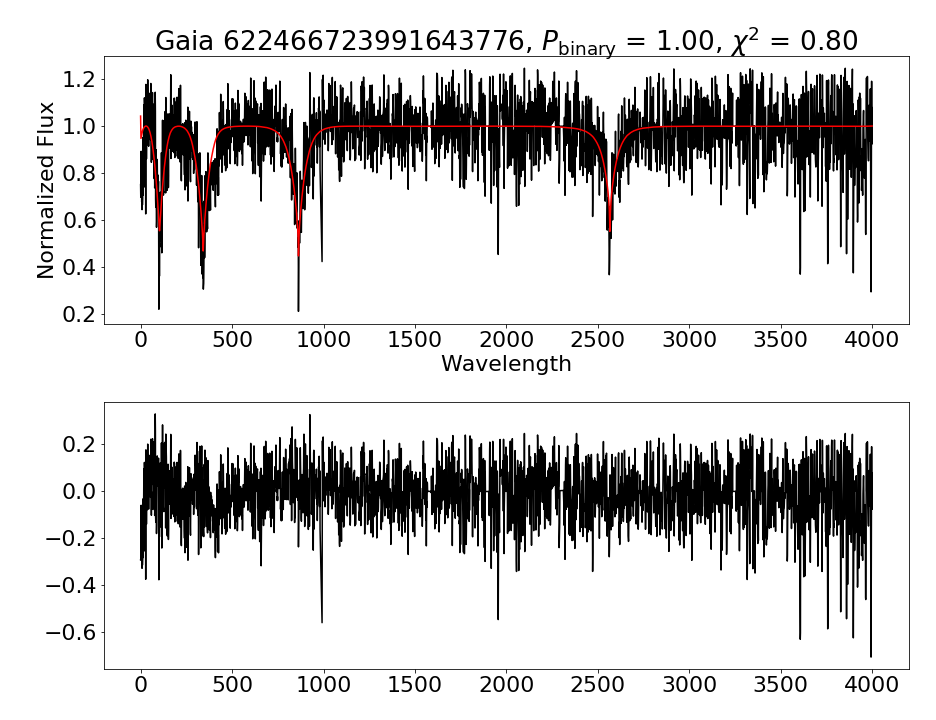

622466723991643776
Probability of Binarity = 1.00
152.50285646101133 17.22828450758367


<IPython.core.display.Javascript object>


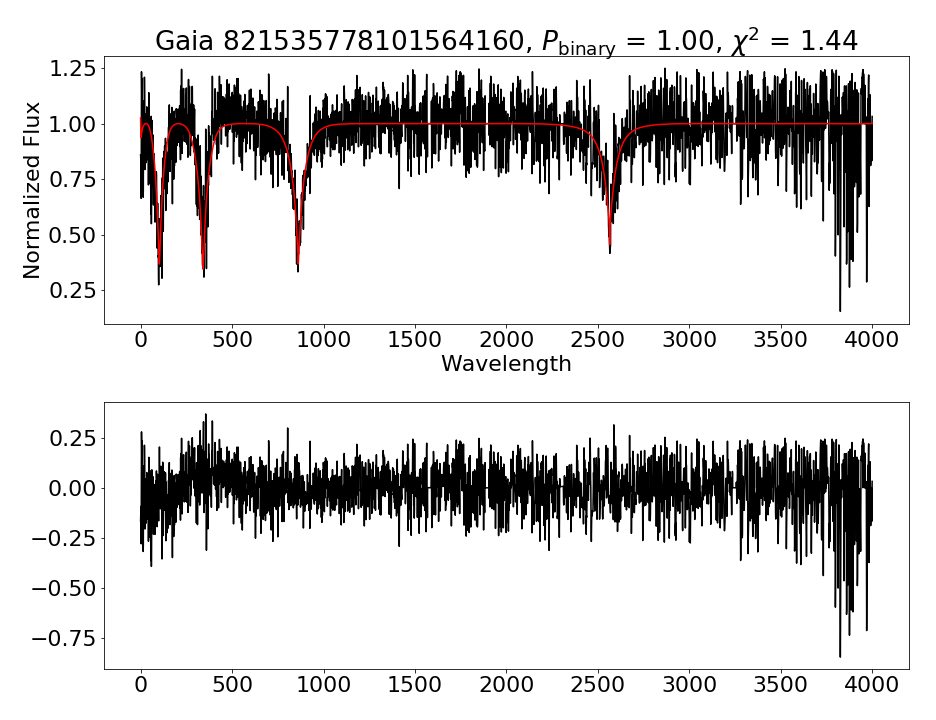

821535778101564160
Probability of Binarity = 1.00
148.77950932881154 46.63539499090328


<IPython.core.display.Javascript object>


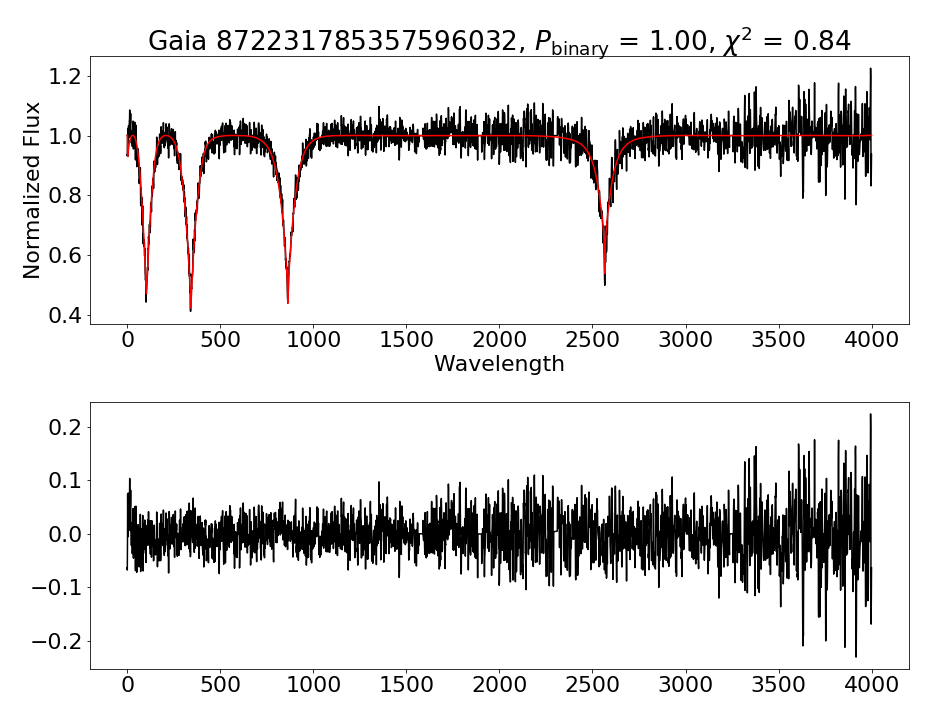

872231785357596032
Probability of Binarity = 1.00
114.53143451570976 27.23841253183083


<IPython.core.display.Javascript object>


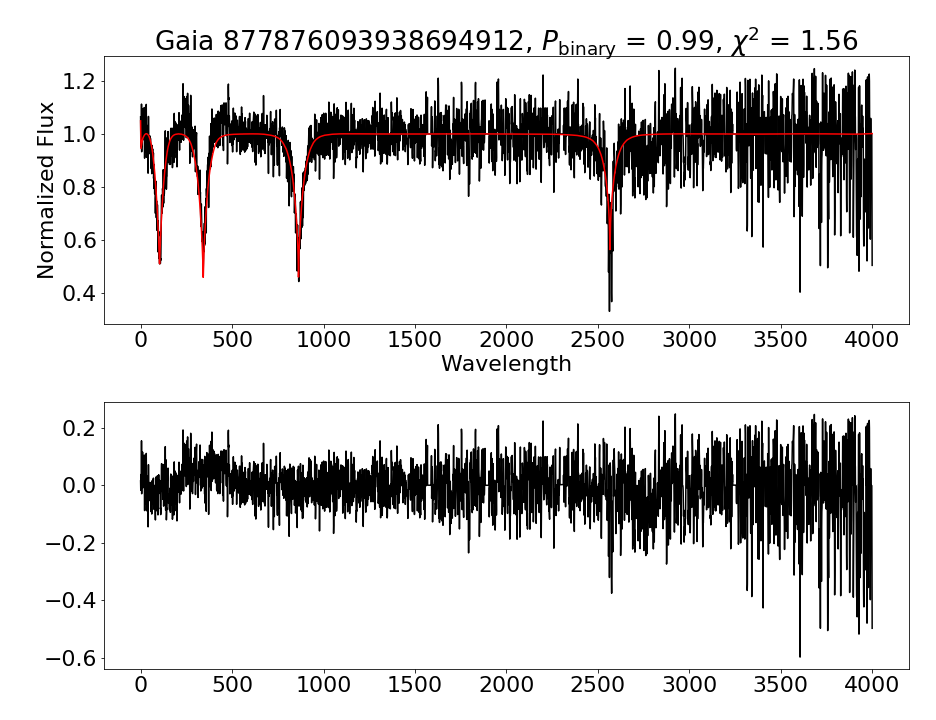

877876093938694912
Probability of Binarity = 0.99
121.14692005539318 31.523798567129187


<IPython.core.display.Javascript object>


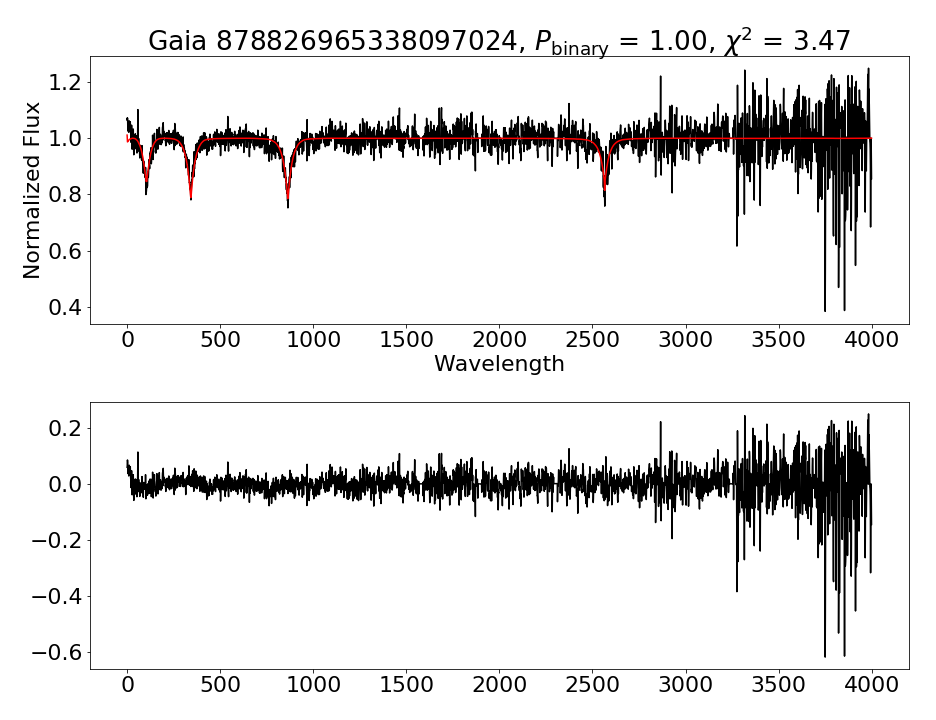

878826965338097024
Probability of Binarity = 1.00
117.06915179369727 29.389141223991153


<IPython.core.display.Javascript object>


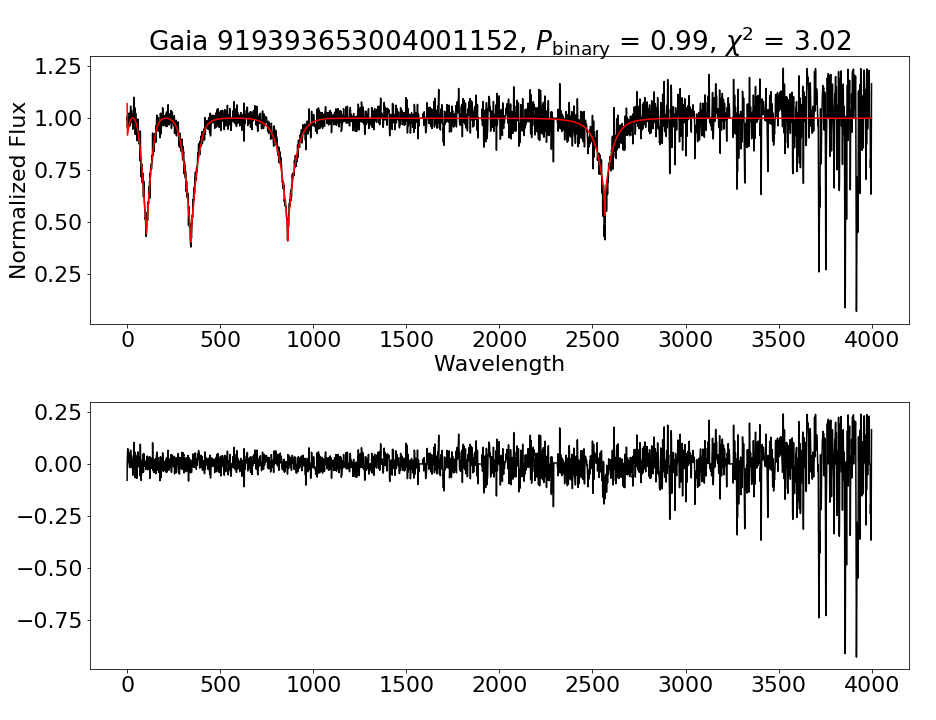

919393653004001152
Probability of Binarity = 0.99
119.03238448695741 38.058780932742415


<IPython.core.display.Javascript object>


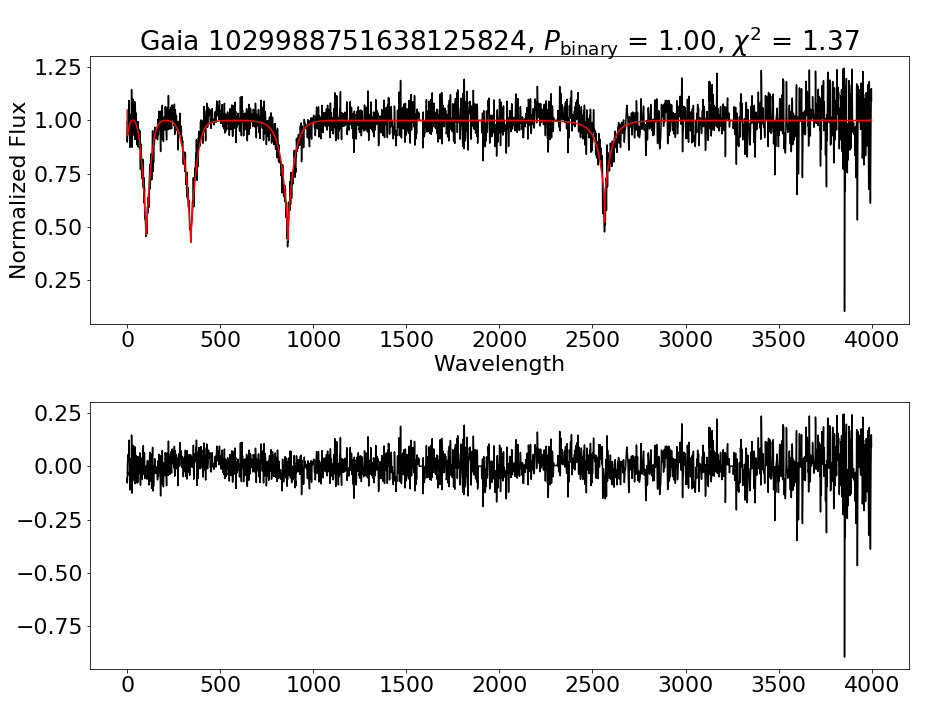

1029988751638125824
Probability of Binarity = 1.00
131.63518059650107 54.04760542566349


<IPython.core.display.Javascript object>


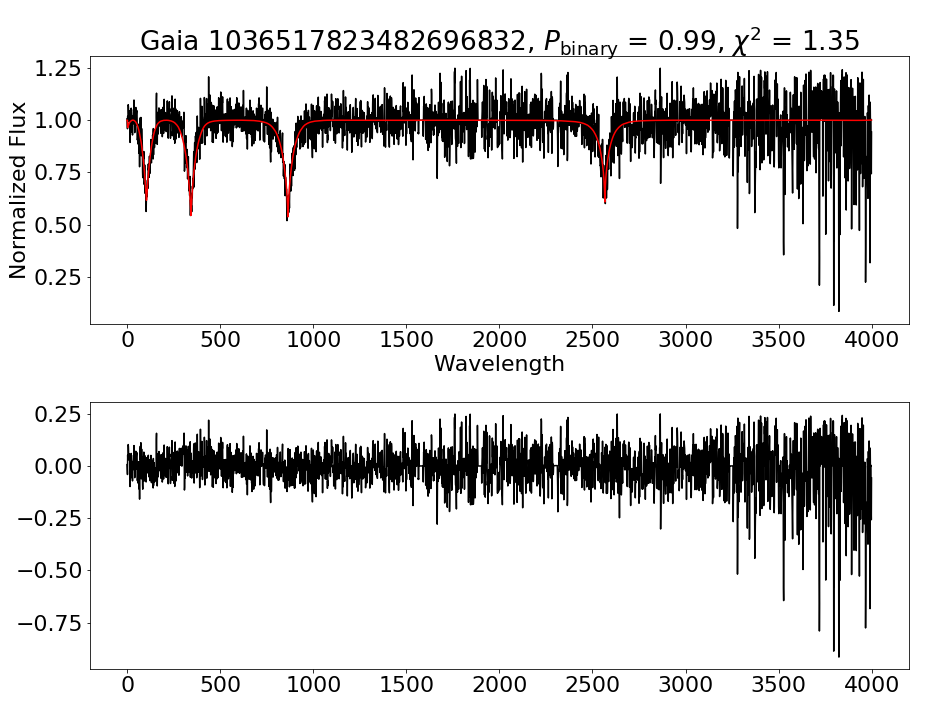

1036517823482696832
Probability of Binarity = 0.99
136.82530784479133 57.054520240036275


<IPython.core.display.Javascript object>


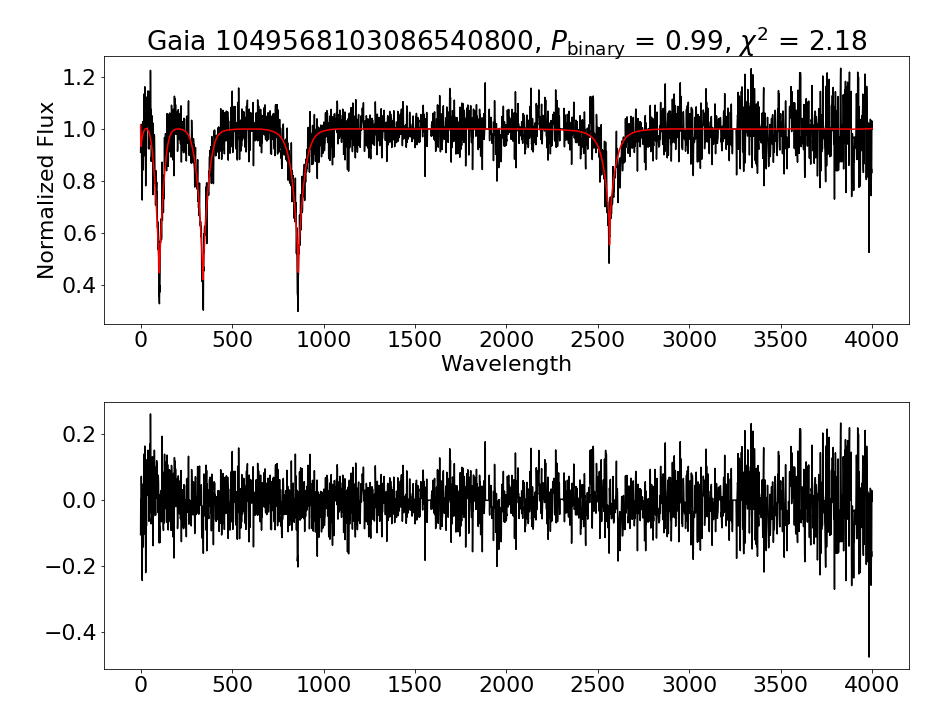

1049568103086540800
Probability of Binarity = 0.99
148.18585530808542 58.80783964519277


<IPython.core.display.Javascript object>


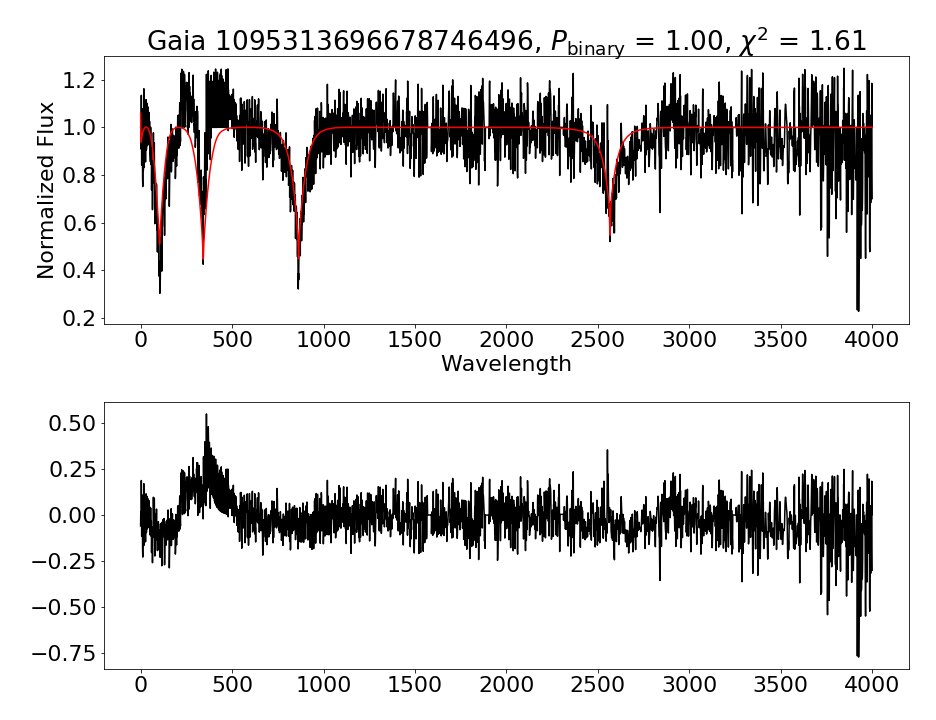

1095313696678746496
Probability of Binarity = 1.00
118.46929728256777 66.45602014114483


<IPython.core.display.Javascript object>


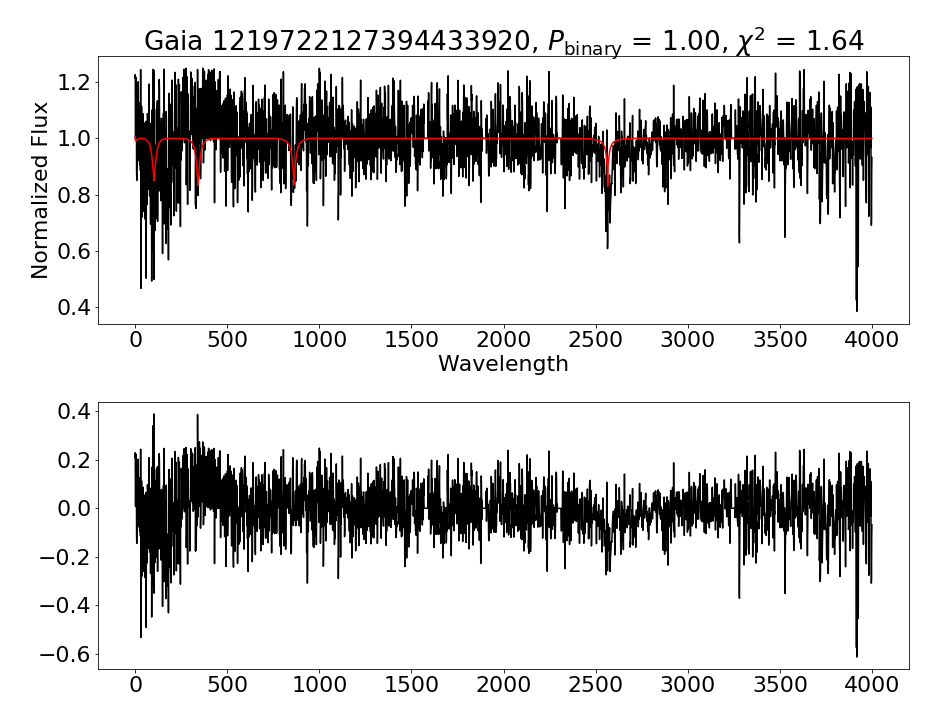

1219722127394433920
Probability of Binarity = 1.00
236.52210919711558 24.633121646991146


<IPython.core.display.Javascript object>


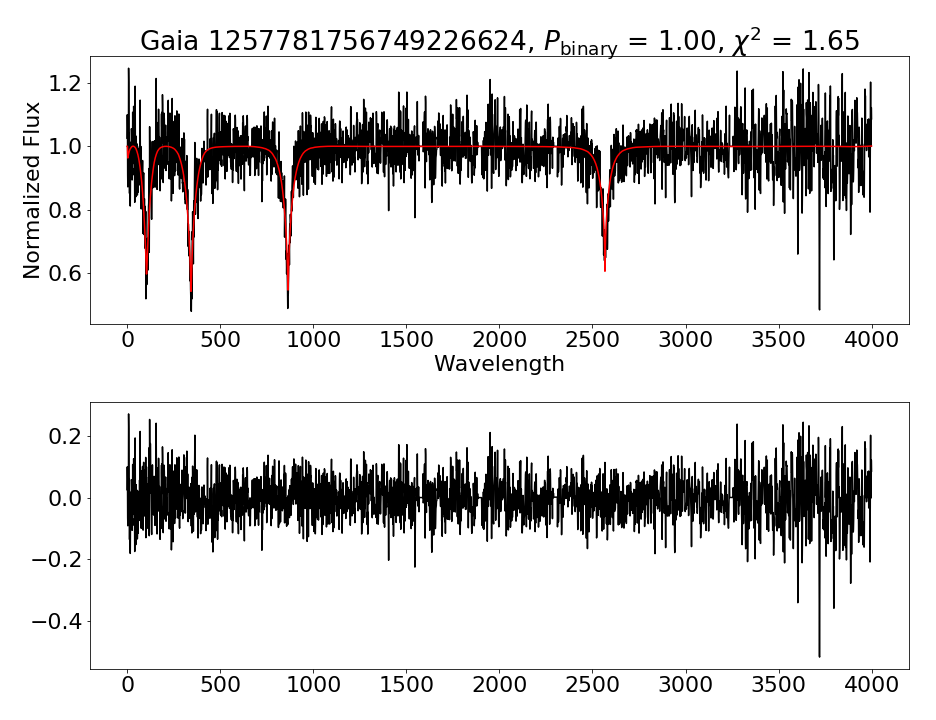

1257781756749226624
Probability of Binarity = 1.00
210.39277177917154 24.264761272171125


<IPython.core.display.Javascript object>


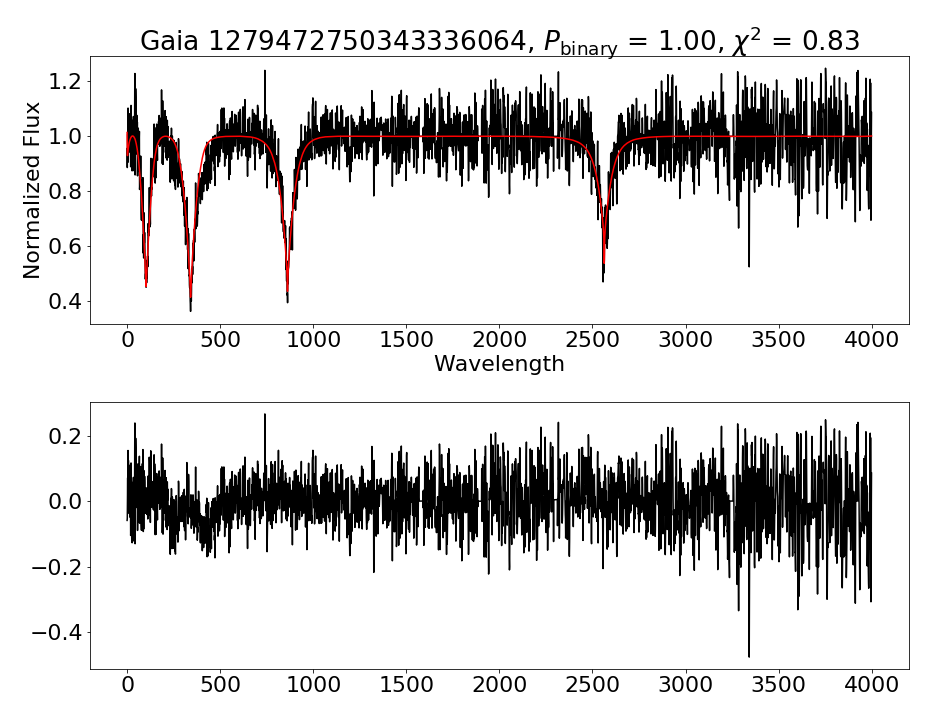

1279472750343336064
Probability of Binarity = 1.00
219.38105083312644 26.399095881690393


<IPython.core.display.Javascript object>


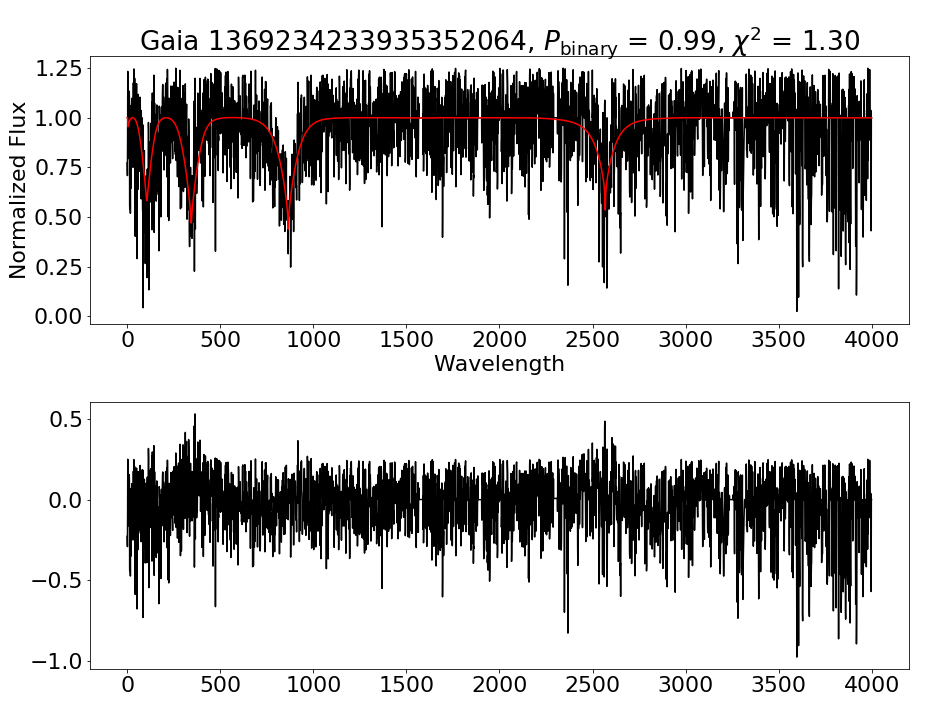

1369234233935352064
Probability of Binarity = 0.99
236.19566052145873 31.303037499527434


<IPython.core.display.Javascript object>


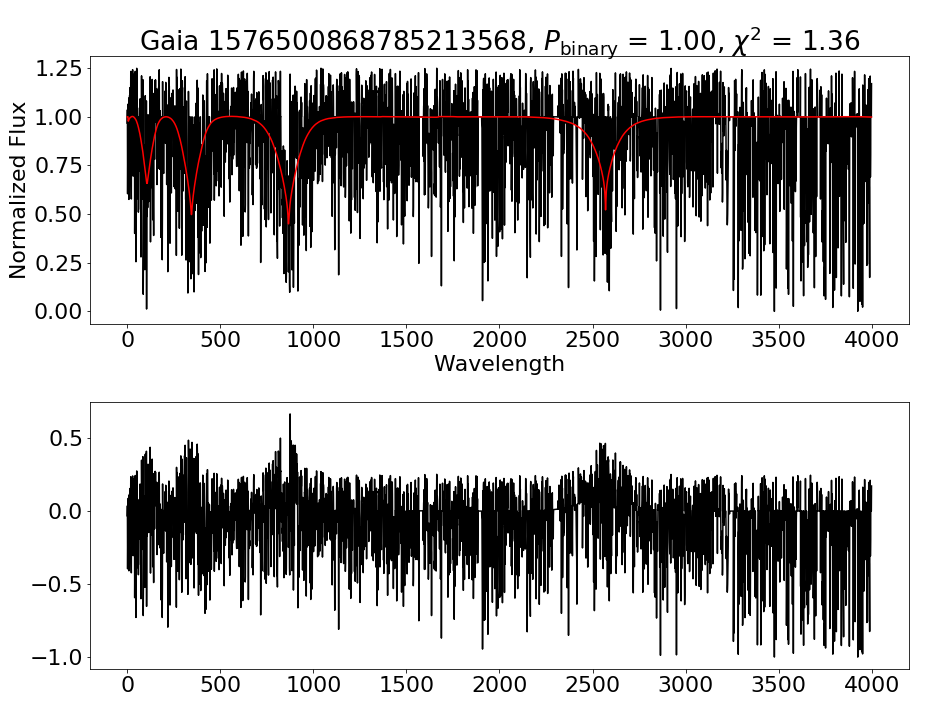

1576500868785213568
Probability of Binarity = 1.00
194.09435041544626 56.062479867510355


<IPython.core.display.Javascript object>


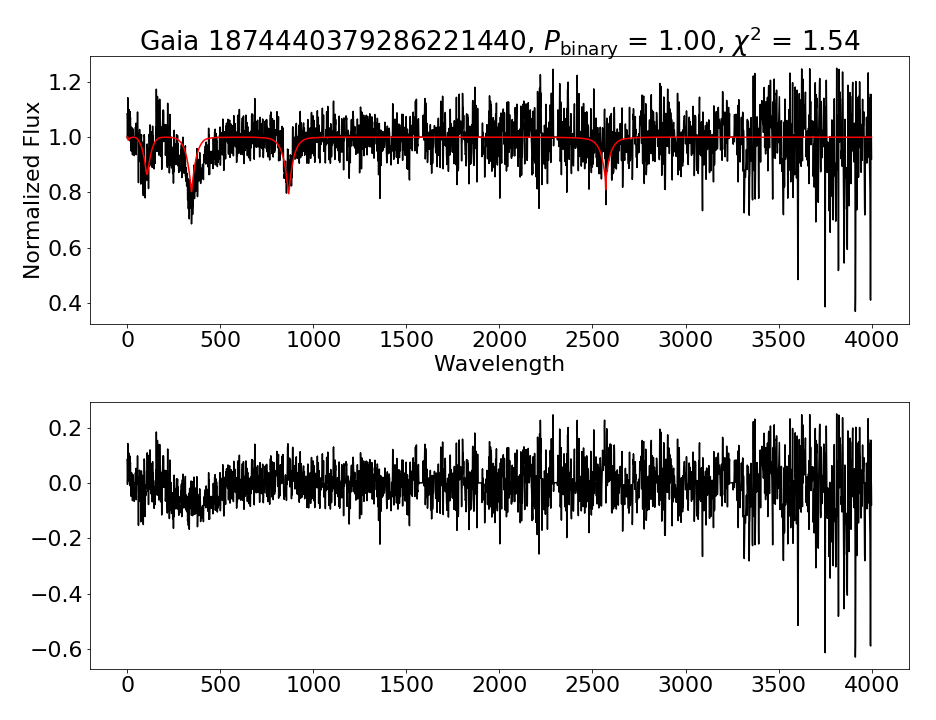

1874440379286221440
Probability of Binarity = 1.00
337.84704869043395 22.13980382586538


<IPython.core.display.Javascript object>


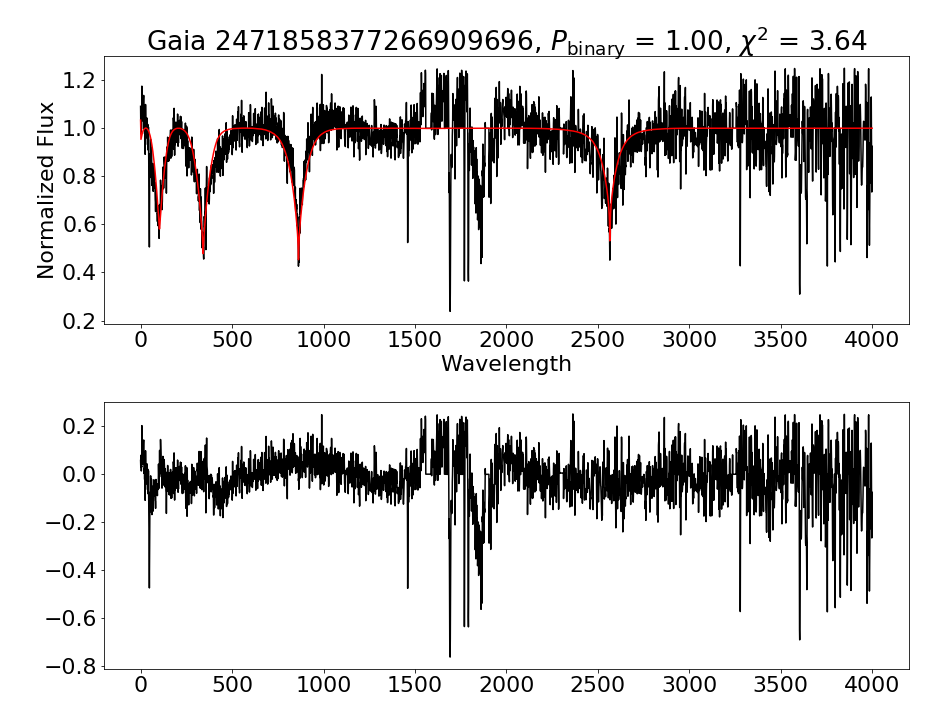

2471858377266909696
Probability of Binarity = 1.00
18.11470149950654 -8.960795948073022


<IPython.core.display.Javascript object>


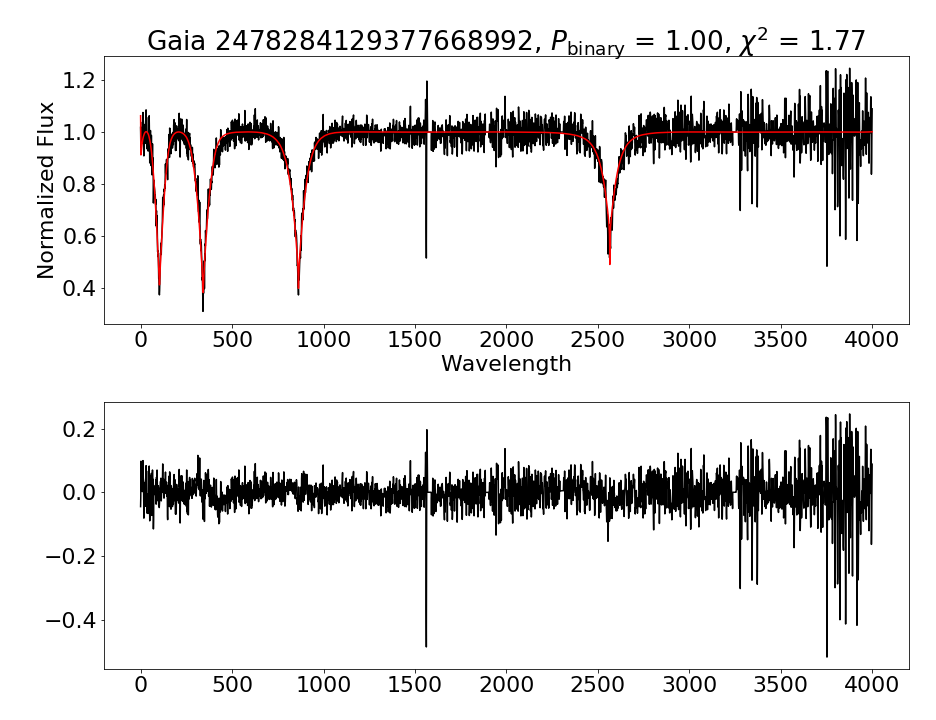

2478284129377668992
Probability of Binarity = 1.00
22.226914702084883 -7.361278927466597


<IPython.core.display.Javascript object>


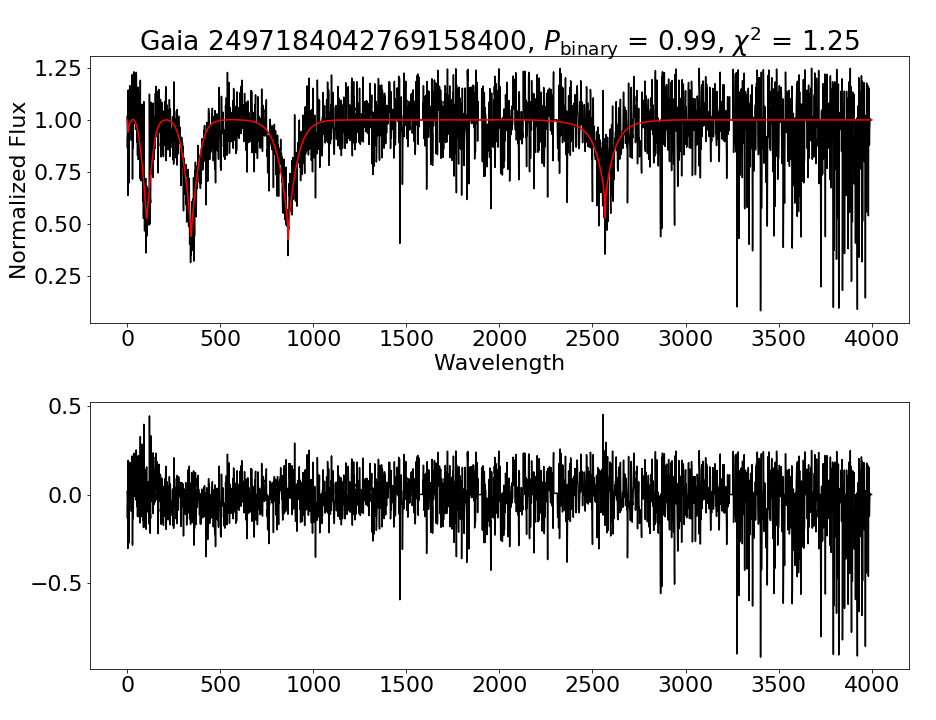

2497184042769158400
Probability of Binarity = 0.99
39.05694845731717 -0.639502495123736


<IPython.core.display.Javascript object>


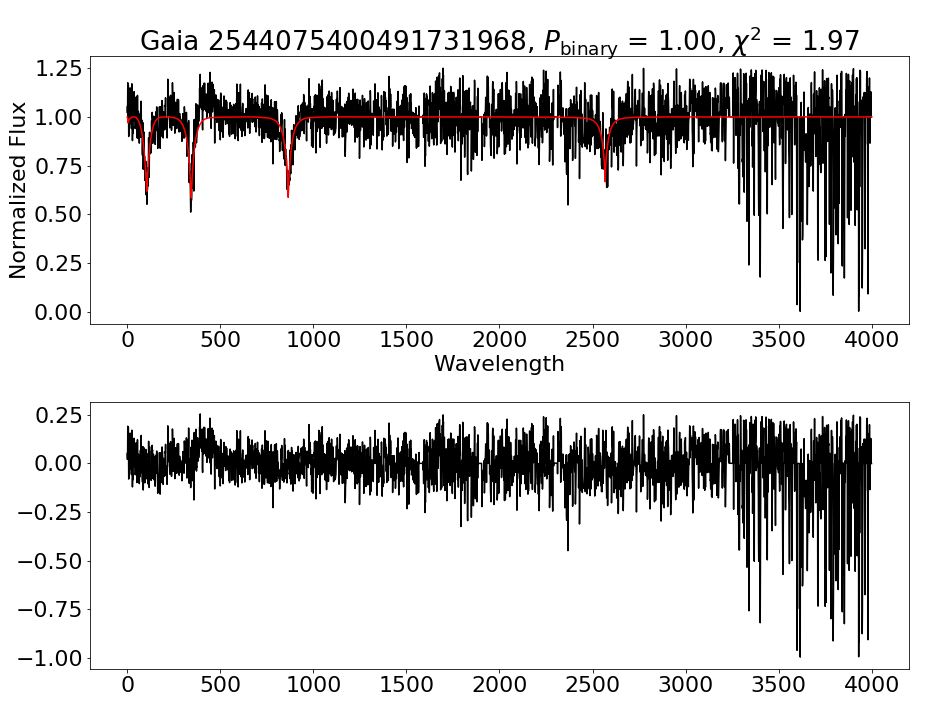

2544075400491731968
Probability of Binarity = 1.00
8.049958553862668 0.8119124934657377


<IPython.core.display.Javascript object>


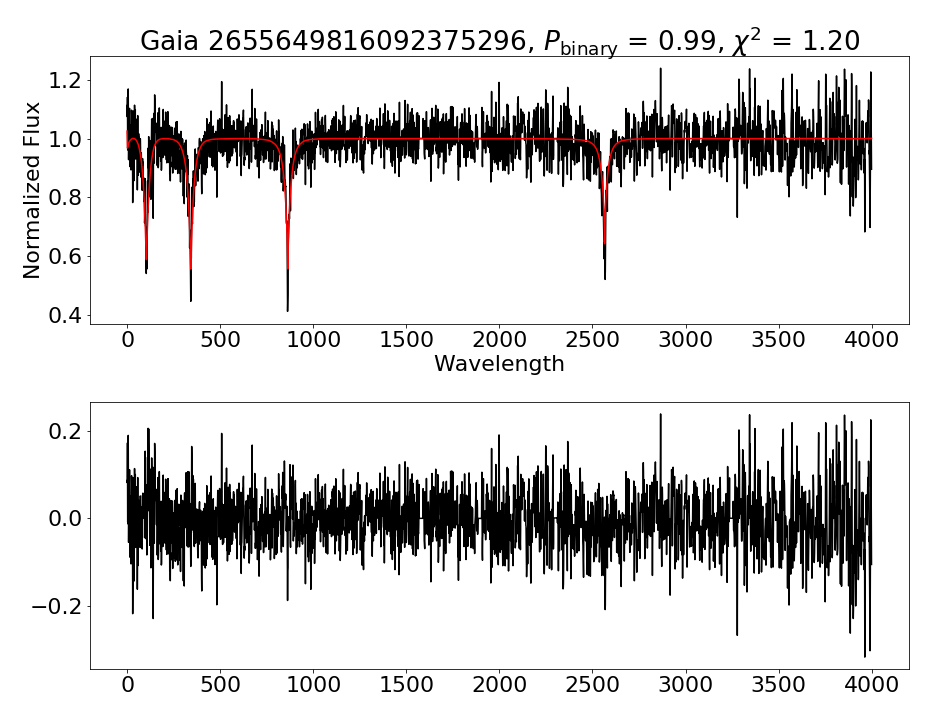

2655649816092375296
Probability of Binarity = 0.99
344.9160268997145 2.2537446168526087


<IPython.core.display.Javascript object>


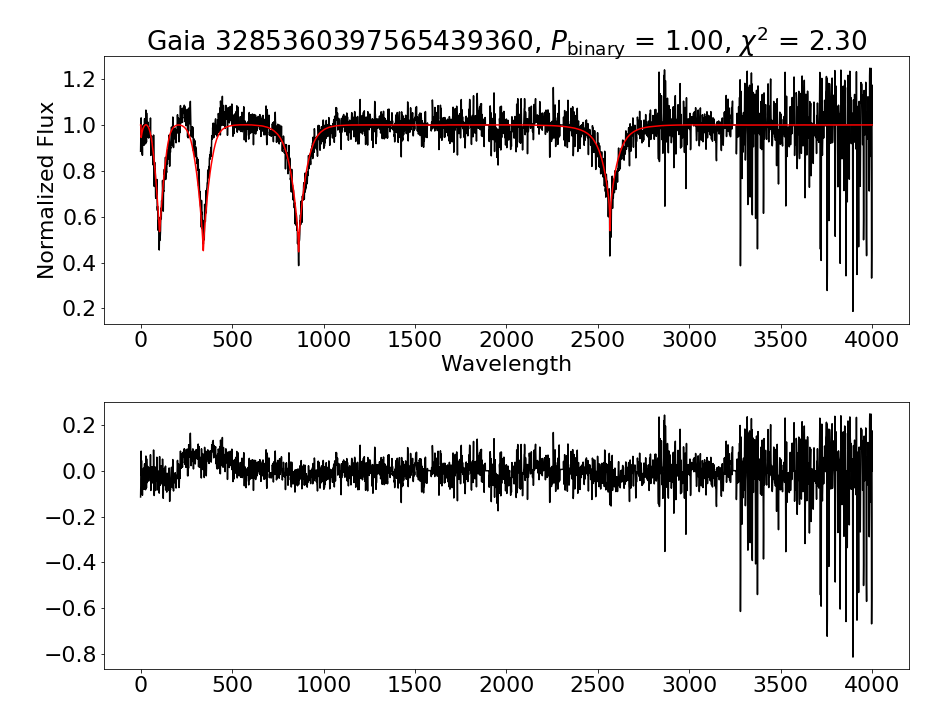

3285360397565439360
Probability of Binarity = 1.00
64.5165209006882 6.851223239544849


<IPython.core.display.Javascript object>


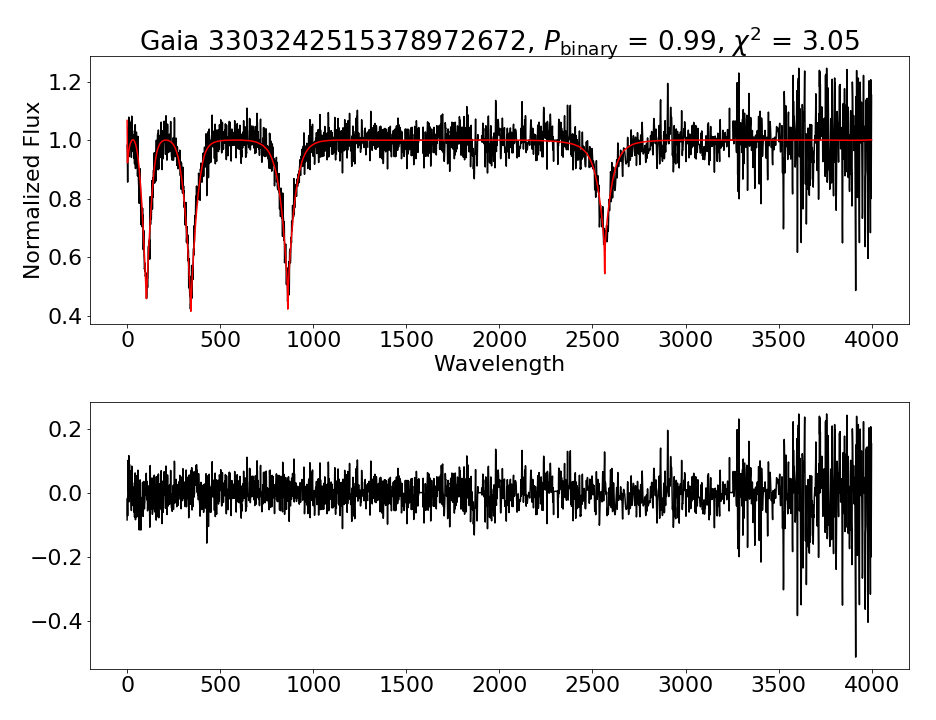

3303242515378972672
Probability of Binarity = 0.99
58.34960380866843 11.200115857546175


<IPython.core.display.Javascript object>


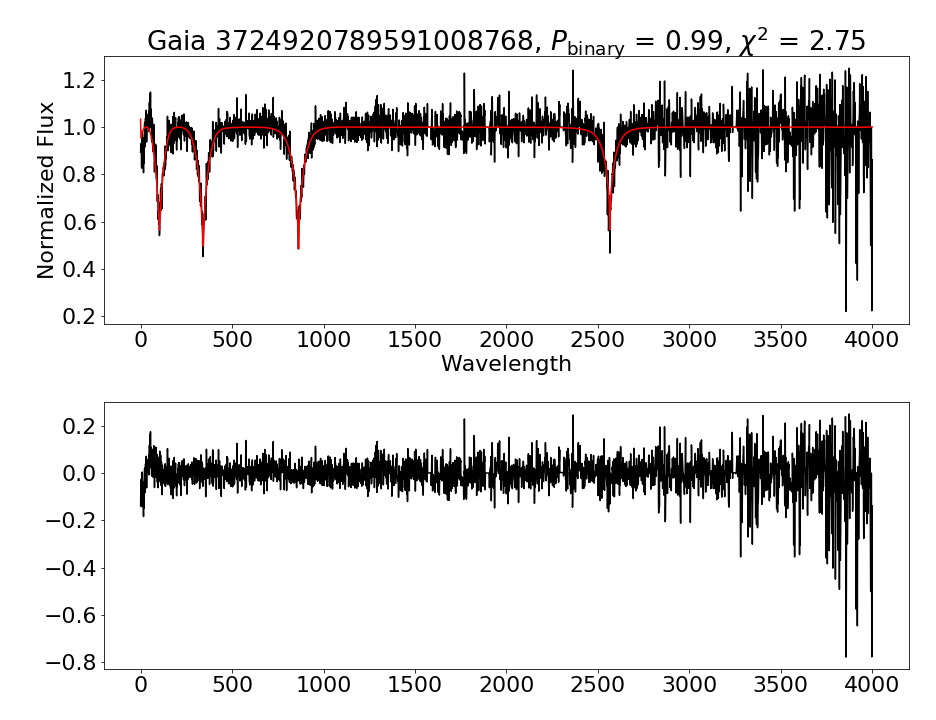

3724920789591008768
Probability of Binarity = 0.99
205.24578175861797 8.735420155578637


<IPython.core.display.Javascript object>


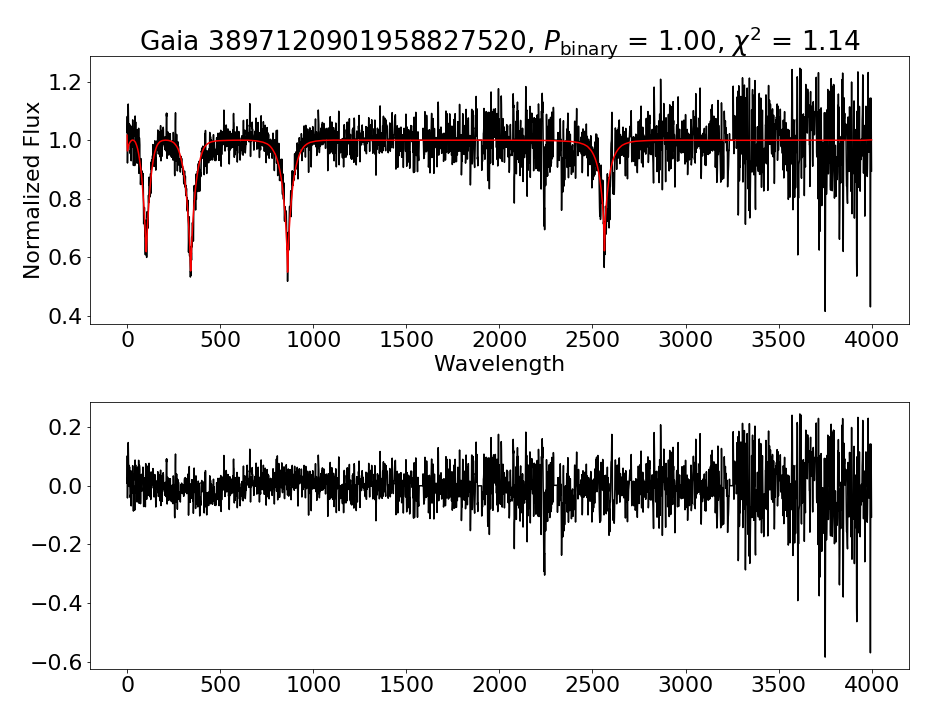

3897120901958827520
Probability of Binarity = 1.00
174.819595216629 4.932890705048355


<IPython.core.display.Javascript object>


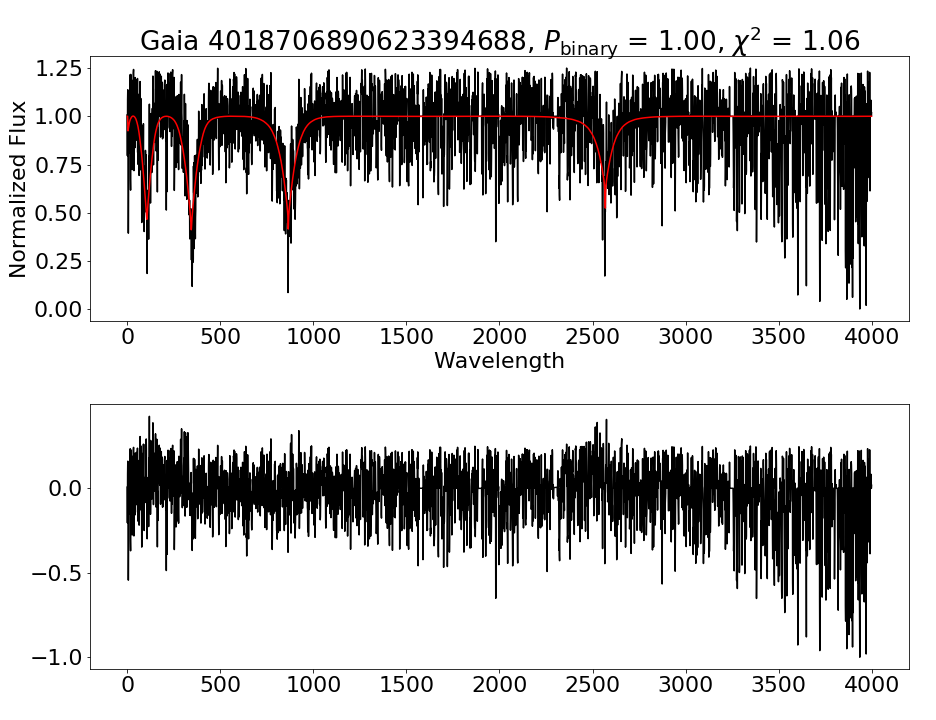

4018706890623394688
Probability of Binarity = 1.00
171.79696121260952 27.184668927410712


<IPython.core.display.Javascript object>


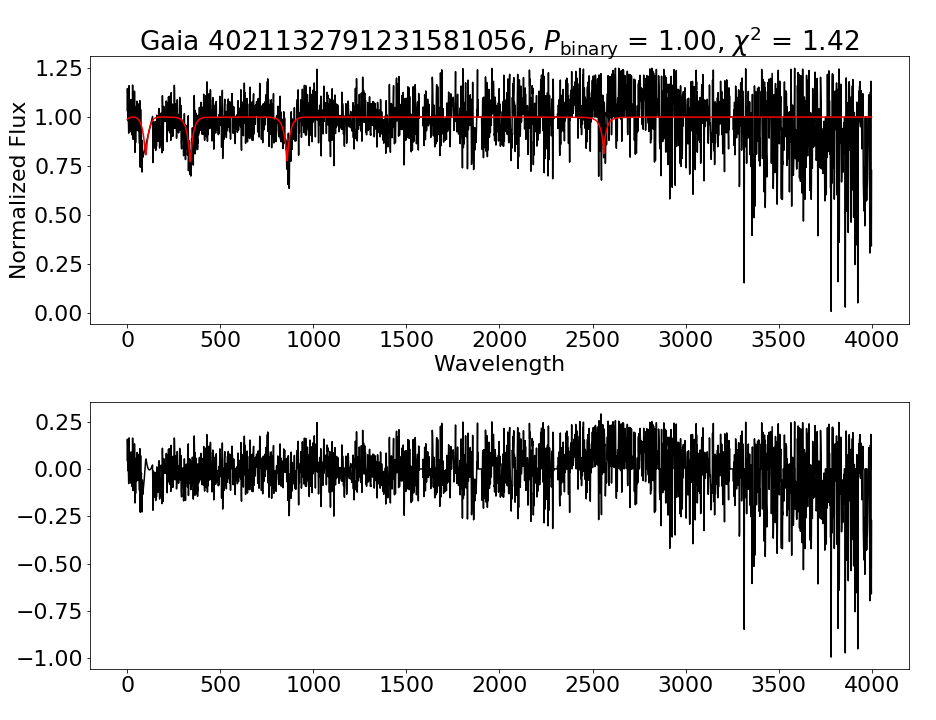

4021132791231581056
Probability of Binarity = 1.00
176.00874287975924 31.157257535555974


<IPython.core.display.Javascript object>


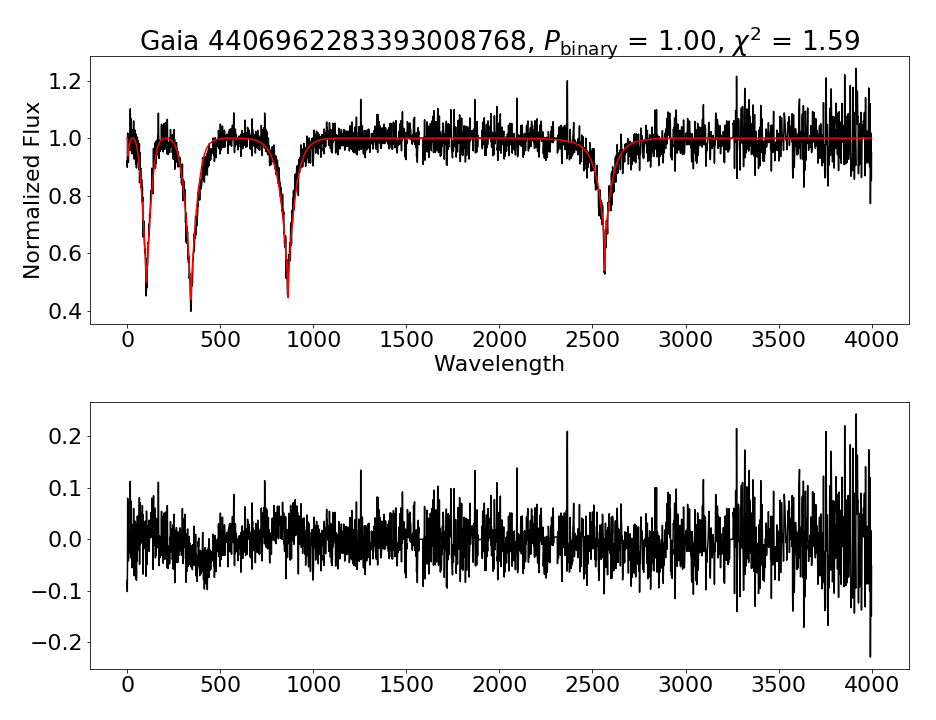

4406962283393008768
Probability of Binarity = 1.00
245.8537293219175 -1.1901182876014855


<IPython.core.display.Javascript object>


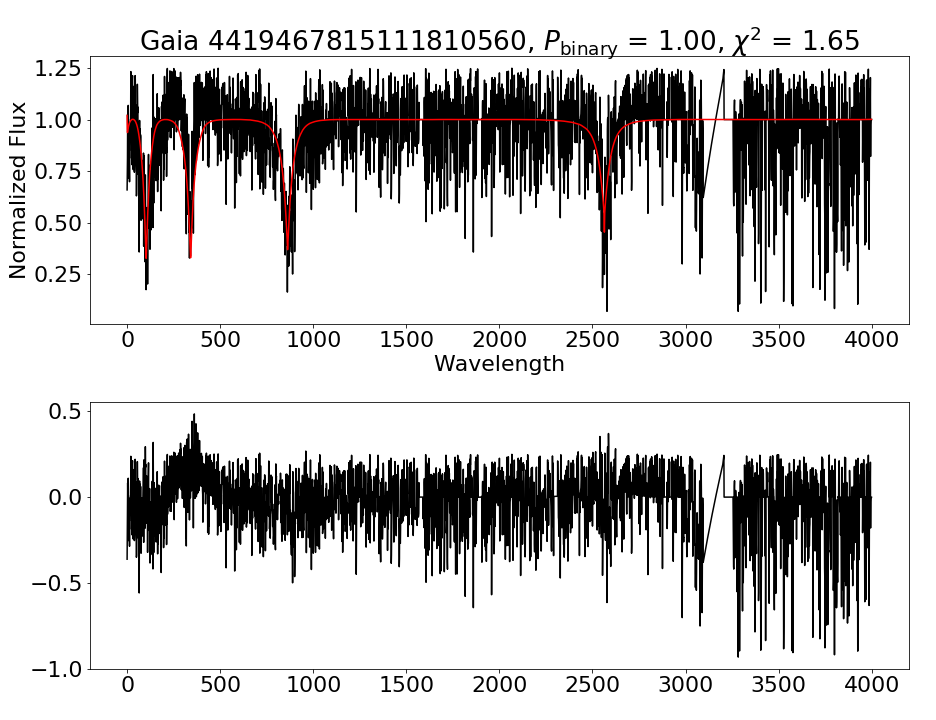

4419467815111810560
Probability of Binarity = 1.00
225.82630802916313 -0.17052942664225393


<IPython.core.display.Javascript object>


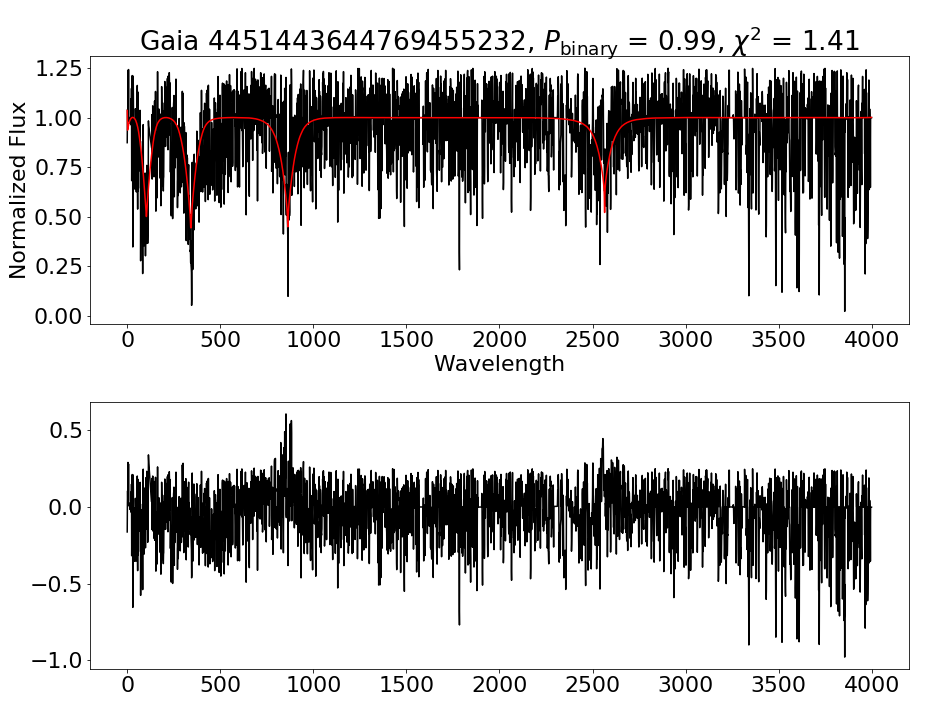

4451443644769455232
Probability of Binarity = 0.99
242.67967519560523 8.364804847577757


<IPython.core.display.Javascript object>


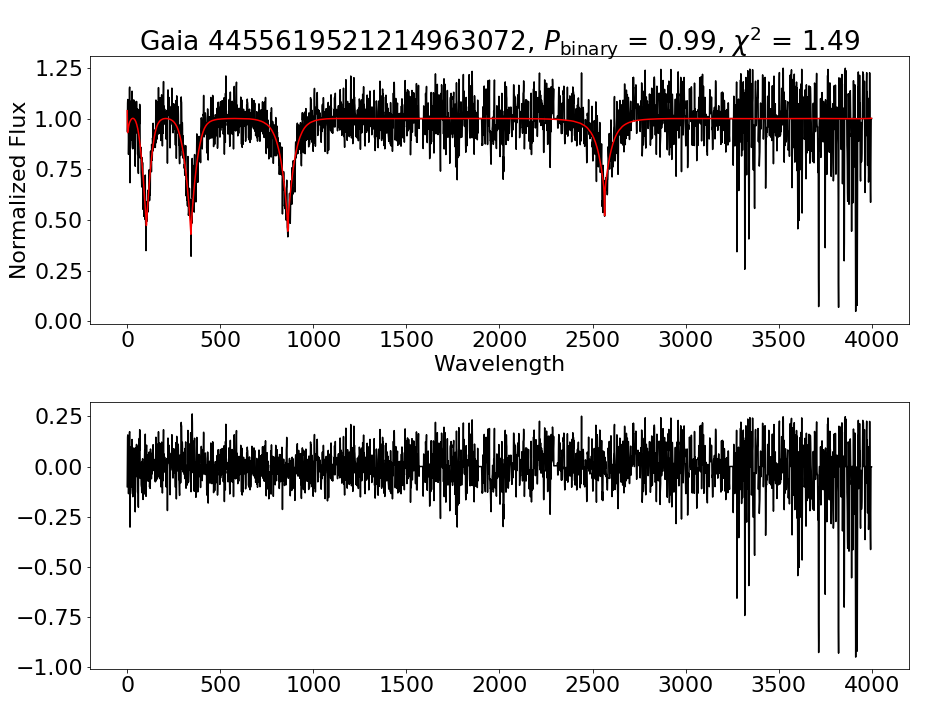

4455619521214963072
Probability of Binarity = 0.99
237.8977468182944 9.867227069904262


<IPython.core.display.Javascript object>


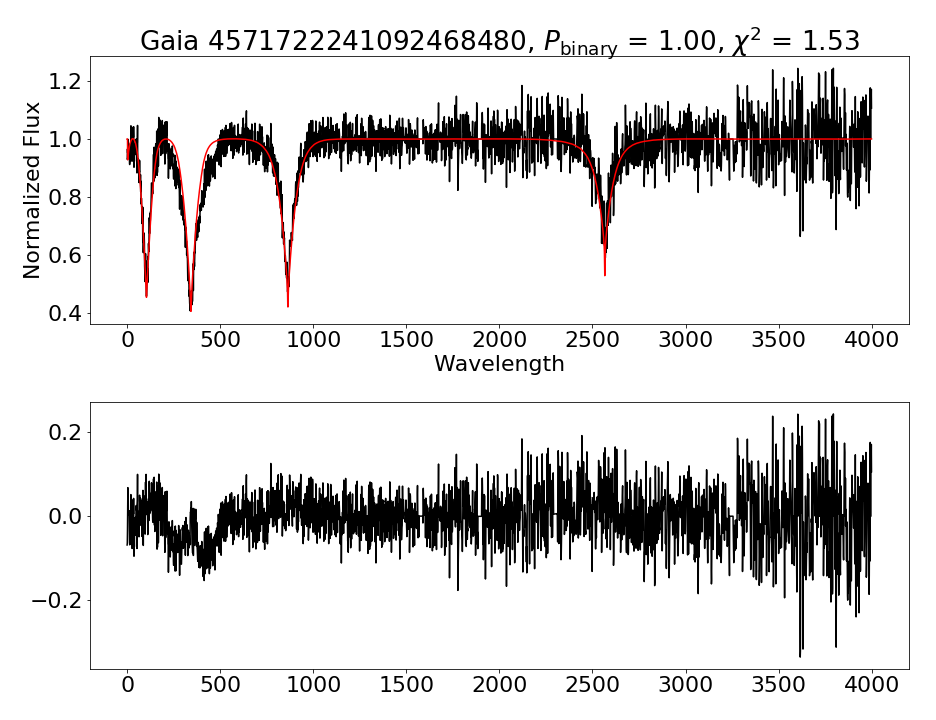

4571722241092468480
Probability of Binarity = 1.00
257.238176372875 23.48280537236599


<IPython.core.display.Javascript object>


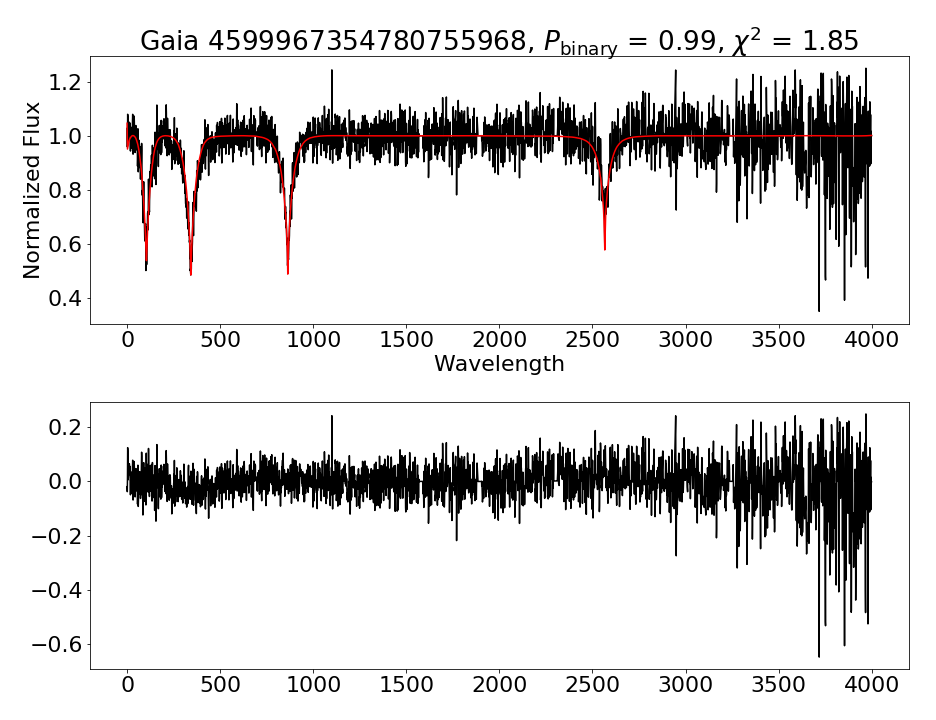

4599967354780755968
Probability of Binarity = 0.99
261.11659260494457 30.930601201795795


<IPython.core.display.Javascript object>


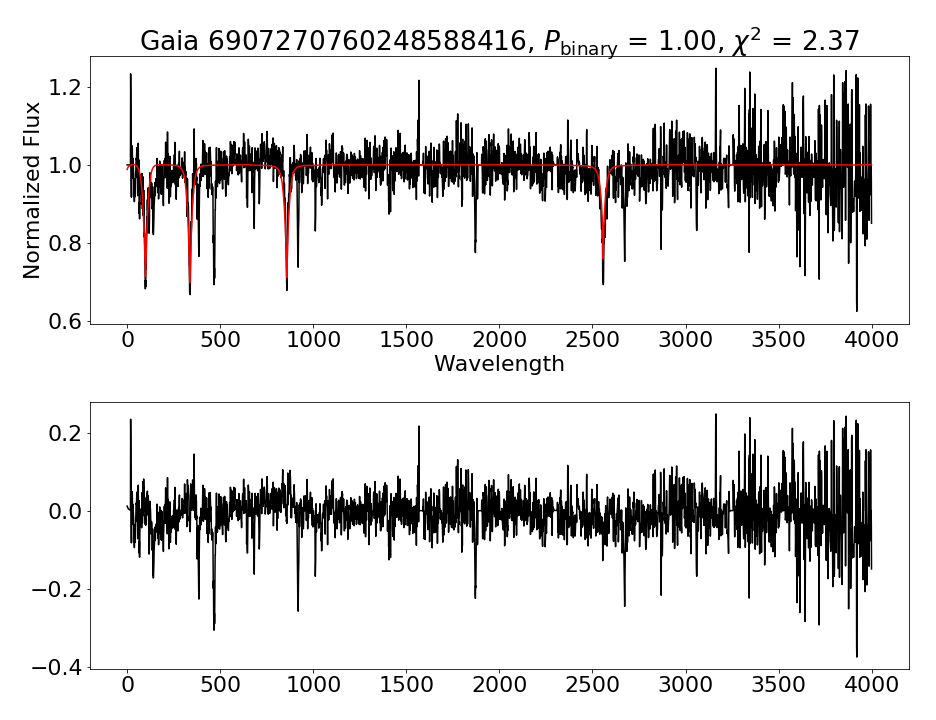

6907270760248588416
Probability of Binarity = 1.00
310.99399392447754 -6.840569374930298


In [387]:
%matplotlib notebook
for obj in cleantable[binaries]:
    spectrum = continuum_normalize(get_spectrum(obj['source_id']),lamgrid)
    fit,chi = fitspec(spectrum)
    plt.figure(figsize = (13,10))
    plt.subplot(211)
    plt.plot(spectrum,'k')
    plt.plot(fit,'r')
    plt.title('Gaia '+str(obj['source_id'])+', $P_{\mathrm{binary}}$ = %.2f, '%obj['bin_prob']+'$\chi^2$ = %.2f'%chi)
    print(obj['source_id'])
    print('Probability of Binarity = %.2f'%obj['bin_prob'])
    plt.xlabel('Wavelength')
    plt.ylabel('Normalized Flux')
    print(str(obj['ra']) + ' '+str(obj['dec']))
    plt.subplot(212)
    plt.plot(spectrum-fit,'k')
    plt.tight_layout()
    plt.show()